# Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import json
import shutil
import re
import pydicom as dicomio
import splitfolders
import torchvision.transforms as transforms
import albumentations as A
import kornia

from pydicom import dcmread
from skimage.morphology import disk, binary_dilation, binary_opening
from skimage.measure import label, regionprops, find_contours

In [2]:
%run utils.ipynb

# Sanity Checks

In [3]:
HCRP_EXAMS_DIR = "/Storage/PauloOctavioDir/Exames/"
NSCLC_EXAMS_DIR = "/Storage/PauloOctavioDir/NSCLC-Radiomics/"
LUNG_PET_CT_DX_IMG_DIR = "/Storage/PauloOctavioDir/Lung-PET-CT-Dx/Images/"
LUNG_PET_CT_DX_ANT_DIR = "/Storage/PauloOctavioDir/Lung-PET-CT-Dx/Annotations/"

In [4]:
exam_id = 51
images_dir = f"/Storage/PauloOctavioDir/Exames/{exam_id}/dicomRT/Original-dcm"
masks_dir = f"/Storage/PauloOctavioDir/Exames/{exam_id}/Segmentado/dcm"

In [5]:
for exam in os.listdir(HCRP_EXAMS_DIR):
    exam_dir = HCRP_EXAMS_DIR + exam
    if os.path.isdir(exam_dir):
        exam_files = os.listdir(exam_dir)
        found = all(i in exam_files for i in ["dicomRT", "Segmentado"])
        if not found:
            print(f"Folders not found for exam #{exam}.")
            print(f"The founded folders are: {exam_files}.\n")

In [6]:
for exam in os.listdir(HCRP_EXAMS_DIR):
    exam_dir = HCRP_EXAMS_DIR + exam
    if os.path.isdir(exam_dir):
        images = os.listdir(exam_dir + "/dicomRT/Original-dcm")
        masks = os.listdir(exam_dir + "/Segmentado/dcm")
        if len(set(images) - {"rtss.dcm"}) != len(set(masks)):
            print(f"Images and masks don't match for exam #{exam}.")
            print(
                f"{len(set(images) - {'rtss.dcm'})} images and {len(set(masks))} segmentations"
            )
        for file in set(images) - {"rtss.dcm"}:
            if not re.search("IMG\d{4}.dcm$", file):
                print(f"File {file} of exam {exam} does not match pattern!")

Images and masks don't match for exam #101.
337 images and 0 segmentations
Images and masks don't match for exam #104.
262 images and 0 segmentations
Images and masks don't match for exam #102.
257 images and 0 segmentations


# Neoplasia Database

In [7]:
df = pd.read_csv("data/Banco neoplasia pulmonar HCFMRP.csv")
# clean colum names
df.columns = [col.split(".")[1].strip() for col in df.columns]
df = df.rename(
    columns={
        "ESTADIO T CLINICO (8a edição)": "ESTADIO T",
        "ESTADIO N CLINICO": "ESTADIO N",
        "ESTADIO M CLINICO": "ESTADIO M",
    }
)
# get columns description
colunmns_description = df.iloc[0].to_dict()
df = df.drop([0, 207, 208]).reset_index(drop=True)
# split exam with REG EXAME = '126 e 127' in two separate exams
row = df[df["REG EXAME"] == "126 e 127"].copy()
df.iloc[125]["REG EXAME"] = "126"
row["REG EXAME"] = "127"
df = df.append(row)
# drop rows and columns with only NaN value
df.dropna(axis=0, how="all", inplace=True)
df.dropna(axis=1, how="all", inplace=True)
df.to_csv("data/lung_neoplasm_database_cleaned.csv", index=False)
df.head()

,REG EXAME,DATA NASCIMENTO,SEXO,TABAGISMO PREGRESSO,DATA TC,TECNICA TC,LOBO DA LESÃO,POSIÇÃO DA LESÃO,MAIOR DIÂMETRO,ESTADIO T,ESTADIO N,ESTADIO M,DATA 1o DIAGN PATOLÓGICO,TIPO PATOLOGIA (FINAL),TIPO HISTOLÓGICO,DATA PROGRESSÃO DOENÇA,LOCAL DA PROGRESSÃO
0,1,8/19/1947,1,X,3/2/2017,1,3,2,30,2a,0,1c,8/2/2017,NaN,2,NaN,NaN
1,2,1/25/1946,1,X,26/10/2015,1,5,2,23,1b,0,1c,8/12/2015,2,2,29/6/2016,1
2,3,7/30/1942,2,X,14/3/2016,1,1,2,11,1a,0,0,13/4/2016,2,2,7/18/2017,"5, 8, 6"
3,4,6/28/1952,2,X,21/2/2017,1,1,2,16,1a,3,0,22/2/2017,NaN,3,5/29/2018,"1, 9"
4,5,2/12/1943,1,X,3/10/2012,1,4,2,36,2a,1,0,19/9/2012,3,5,18/5/2016,1


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 127 entries, 0 to 125
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   REG EXAME                 127 non-null    object
 1   DATA NASCIMENTO           127 non-null    object
 2   SEXO                      127 non-null    object
 3   TABAGISMO PREGRESSO       127 non-null    object
 4   DATA TC                   127 non-null    object
 5   TECNICA TC                127 non-null    object
 6   LOBO DA LESÃO             127 non-null    object
 7   POSIÇÃO DA LESÃO          127 non-null    object
 8   MAIOR DIÂMETRO            127 non-null    object
 9   ESTADIO T                 126 non-null    object
 10  ESTADIO N                 127 non-null    object
 11  ESTADIO M                 126 non-null    object
 12  DATA 1o DIAGN PATOLÓGICO  127 non-null    object
 13  TIPO PATOLOGIA (FINAL)    122 non-null    object
 14  TIPO HISTOLÓGICO          

In [9]:
with open("colunmns_description.json", "w") as fp:
    json.dump(colunmns_description, fp)
print(colunmns_description)

{'REG EXAME': nan, 'DATA NASCIMENTO': 'dd/mm/aaaa', 'SEXO': '1- masc, 2- fem', 'TABAGISMO ATUAL': '0- ausente, X anos-maço se presente', 'TABAGISMO PREGRESSO': '0- ausente, X anos-maço se presente', 'DATA TC': 'dd/mm/aaaa', 'TECNICA TC': '1- MDTC contraste, 2- MDTC sem contraste, 3- outra', 'LOBO DA LESÃO': '1- LSD, 2- LM, 3- LID, 4- LSE, 5- Lin, 6- LIE', 'POSIÇÃO DA LESÃO': '1- central, 2- periférica', 'MAIOR DIÂMETRO': 'mm', 'ESTADIO T': '1a, 1b, 1c, 2a, 2b, 3, 4', 'ESTADIO N': '0, 1, 2, 3', 'ESTADIO M': '0, 1a, 1b, 1c', 'DATA 1o DIAGN PATOLÓGICO': 'dd/mm/aaaa', 'TIPO PATOLOGIA (FINAL)': '1- biópsia transbrônquica, 2- biópsia percutânea, 3- cirurgia', 'TIPO HISTOLÓGICO': '1- SCLC, 2- NSCLC adeno, 3- NSCLC escamoso, 4- NSCLC adenoescamoso, 5- Large cell, 6- carcinoide típico, 7- carcinoide atípico, 8- NSCLC indiferenciado, 9- outro', 'DATA PROGRESSÃO DOENÇA': nan, 'LOCAL DA PROGRESSÃO': '1- pulmão, 2- mediastino, 3- pleura, 4- adrenal, 5- fígado, 6- osso, 7- SNC, 8- rim, 9- outro'}


# Images with Nodules

In [10]:
df_HCRP = pd.read_csv("data/lung_neoplasm_database_cleaned.csv")
hist_type_map = {
    1: "SCLC",
    2: "LUAD",
    3: "LUSC",
    4: "ADSC",
    5: "LLCC",
    6: "LCTC",
    7: "LCAC",
    8: "NSCI",
    9: "OTHR",
}

In [11]:
df_HCRP["TIPO HISTOLÓGICO"].value_counts()

2    72
3    32
6     8
1     7
9     3
7     2
8     1
5     1
4     1
Name: TIPO HISTOLÓGICO, dtype: int64

### HCRP Dataset

In [43]:
exams_without_seg = ["101", "102", "104"]
for exam_id in sorted(os.listdir(HCRP_EXAMS_DIR)):
    if exam_id not in exams_without_seg:
        images_dir = f"/Storage/PauloOctavioDir/Exames/{exam_id}/dicomRT/Original-dcm"
        masks_dir = f"/Storage/PauloOctavioDir/Exames/{exam_id}/Segmentado/dcm"
        for mask in os.listdir(masks_dir):
            image = re.sub(
                "\d+", mask, str(int(re.findall("\d+", mask)[0]) - 1).zfill(4)
            )

            mask_path = masks_dir + "/" + mask
            image_path = images_dir + "/" + image

            mask_data = dcmread(mask_path).pixel_array
            if mask_data.any():
                hist_type_cat = df_HCRP[df_HCRP["REG EXAME"] == int(exam_id)][
                    "TIPO HISTOLÓGICO"
                ].values[0]
                hist_type_name = hist_type_map[hist_type_cat]
                exam_id = str(exam_id).zfill(3)
                if hist_type_name == "LUSC" or hist_type_name == "LUAD":
                    mask_dest_fpath = f"/Storage/PauloOctavioDir/nodule_images/HCRP/masks/{hist_type_name}_{exam_id}_{mask}"
                    image_dest_fpath = f"/Storage/PauloOctavioDir/nodule_images/HCRP/images/{hist_type_name}_{exam_id}_{image}"
                    os.makedirs(os.path.dirname(mask_dest_fpath), exist_ok=True)
                    os.makedirs(os.path.dirname(image_dest_fpath), exist_ok=True)

                    shutil.copyfile(mask_path, mask_dest_fpath)
                    shutil.copyfile(image_path, image_dest_fpath)
print(
    f"Number of images: {len(os.listdir('/Storage/PauloOctavioDir/nodule_images/HCRP/images/'))}"
)
print(
    f"Number of masks: {len(os.listdir('/Storage/PauloOctavioDir/nodule_images/HCRP/masks/'))}"
)

entrou
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
LCAC
Number of images: 3353
Number of masks: 3353


### NSCLC-Radiomics Dataset

In [52]:
df_nsclc = pd.read_csv(
    "/Storage/PauloOctavioDir/NSCLC-Radiomics/Metadata/NSCLC Radiomics.csv"
)
hist_type_map = hist_type_map = {
    "adenocarcinoma": "LUAD",
    "squamous cell carcinoma": "LUSC",
    "large cell": "LLCC",
    "nos": "OTHR",
    np.nan: "OTHR",
}

In [53]:
df_nsclc["Histology"].value_counts()

squamous cell carcinoma    152
large cell                 114
nos                         63
adenocarcinoma              51
Name: Histology, dtype: int64

In [3]:
from rt_utils import RTStructBuilder
import matplotlib.pyplot as plt


def get_slices_with_nodules(mask_3d):
    slices_with_nodules = []
    for i in range(mask_3d.shape[2]):
        if mask_3d[:, :, i].any():
            slices_with_nodules.append(i)
    return slices_with_nodules


def get_mask_3d(dicom_series_path, rt_struct_path):
    # ref: https://github.com/qurit/rt-utils
    # Load existing RT Struct. Requires the series path and existing RT Struct path
    rtstruct = RTStructBuilder.create_from(
        dicom_series_path=dicom_series_path, rt_struct_path=rt_struct_path
    )
    # Loading the 3D Mask from within the RT Struct
    return rtstruct.get_roi_mask_by_name("GTV-1")


import pydicom
from pydicom.dataset import Dataset, FileDataset
from pydicom.uid import ExplicitVRLittleEndian
import pydicom._storage_sopclass_uids


def write_dicom(
    image, filename, rescale_intercept="0", rescale_slope="1", pixel_spacing=r"1\1"
):
    # ref: https://stackoverflow.com/questions/14350675/create-pydicom-file-from-numpy-array
    if image.dtype != np.uint16:
        image = image.astype(np.uint16)

    meta = pydicom.Dataset()
    meta.MediaStorageSOPClassUID = pydicom._storage_sopclass_uids.CTImageStorage
    meta.MediaStorageSOPInstanceUID = pydicom.uid.generate_uid()
    meta.TransferSyntaxUID = pydicom.uid.ExplicitVRLittleEndian

    ds = Dataset()
    ds.file_meta = meta

    ds.is_little_endian = True
    ds.is_implicit_VR = False

    ds.SOPClassUID = pydicom._storage_sopclass_uids.CTImageStorage

    ds.Modality = "CT"
    ds.SeriesInstanceUID = pydicom.uid.generate_uid()
    ds.StudyInstanceUID = pydicom.uid.generate_uid()
    ds.FrameOfReferenceUID = pydicom.uid.generate_uid()

    ds.BitsStored = 16
    ds.BitsAllocated = 16
    ds.SamplesPerPixel = 1
    ds.HighBit = 15

    ds.ImagesInAcquisition = "1"

    ds.Rows = image.shape[0]
    ds.Columns = image.shape[1]
    ds.InstanceNumber = 1

    ds.RescaleIntercept = rescale_intercept
    ds.RescaleSlope = rescale_slope
    ds.PixelSpacing = pixel_spacing
    ds.PhotometricInterpretation = "MONOCHROME2"
    ds.PixelRepresentation = 1

    pydicom.dataset.validate_file_meta(ds.file_meta, enforce_standard=True)

    ds.PixelData = image.tobytes()
    ds.save_as(filename, write_like_original=False)

In [55]:
for exam_id in os.listdir(NSCLC_EXAMS_DIR):
    if exam_id.startswith("LUNG1"):
        exam_dir = NSCLC_EXAMS_DIR + exam_id
        study = os.listdir(exam_dir)[0]
        study_dir = os.path.join(exam_dir, study)
        study_folders = sorted(os.listdir(study_dir))
        images_dir = os.path.join(study_dir, study_folders[0])
        rtstruct_dir = os.path.join(
            study_dir,
            [folder for folder in study_folders[1:] if "Segmentation" not in folder][0],
        )

        no_images = len(os.listdir(images_dir))
        zfill = 3 if no_images > 99 else 2
        try:
            mask_3d = get_mask_3d(images_dir, rtstruct_dir + "/1-1.dcm")
        except:
            print(f"Problematic image at exam {exam_id}.")
            continue
        slices_with_nodules = get_slices_with_nodules(mask_3d)

        for slice_idx in slices_with_nodules:
            image = f"1-{(str(no_images - slice_idx)).zfill(zfill)}.dcm"
            image_path = images_dir + "/" + image

            hist_type_cat = df_nsclc[df_nsclc["PatientID"] == str(exam_id)][
                "Histology"
            ].values[0]
            hist_type_name = hist_type_map[hist_type_cat]
            if hist_type_name == "LUSC" or hist_type_name == "LUAD":
                image_dest_fpath = f"/Storage/PauloOctavioDir/nodule_images/NSCLC/images/{hist_type_name}_{exam_id}_{image}"
                mask_dest_fpath = f"/Storage/PauloOctavioDir/nodule_images/NSCLC/masks/{hist_type_name}_{exam_id}_{image}"

                os.makedirs(os.path.dirname(image_dest_fpath), exist_ok=True)
                os.makedirs(os.path.dirname(mask_dest_fpath), exist_ok=True)

                shutil.copyfile(image_path, image_dest_fpath)
                write_dicom(mask_3d[:, :, slice_idx], mask_dest_fpath)

Problematic image at exam LUNG1-035.


# Nodules ROI

## HCRP

In [14]:
masks_dir = "/Storage/PauloOctavioDir/nodule_images/HCRP/masks/"
images_dir = "/Storage/PauloOctavioDir/nodule_images/HCRP/images/"
for file in os.listdir(masks_dir):
    mask_path = masks_dir + file
    image_path = images_dir + file

    mask_data = dcmread(mask_path)
    image_data = dcmread(image_path)

    mask = mask_data.pixel_array
    image = image_data.pixel_array

    if mask.sum() > 100:

        selem = disk(3)
        binary_dilated = binary_dilation(mask, selem)

        mask_roi = mask_to_roi(binary_dilated, mask, bbox_extension=10)
        image_roi = mask_to_roi(binary_dilated, image, bbox_extension=10)

        mask_data.PixelData = mask_roi.tobytes()
        image_data.PixelData = image_roi.tobytes()

        mask_data.Rows, mask_data.Columns = mask_roi.shape[0], mask_roi.shape[1]
        image_data.Rows, image_data.Columns = image_roi.shape[0], image_roi.shape[1]

        #         mask_dest_fpath = '/Storage/PauloOctavioDir/nodule_rois/masks/' + file
        #         image_dest_fpath = '/Storage/PauloOctavioDir/nodule_rois/images/' + file

        hist_type = "adeno" if file[:4] == "LUAD" else "squamous"

        mask_dest_fpath = (
            f"/Storage/PauloOctavioDir/nodule_rois/gan/{hist_type}/masks/HCRP_{file}"
        )
        image_dest_fpath = (
            f"/Storage/PauloOctavioDir/nodule_rois/gan/{hist_type}/images/HCRP_{file}"
        )

        os.makedirs(os.path.dirname(mask_dest_fpath), exist_ok=True)
        os.makedirs(os.path.dirname(image_dest_fpath), exist_ok=True)

        mask_data.save_as(mask_dest_fpath, write_like_original=False)
        image_data.save_as(image_dest_fpath, write_like_original=False)

## NSCLC

In [8]:
masks_dir = "/Storage/PauloOctavioDir/nodule_images/NSCLC/masks/"
images_dir = "/Storage/PauloOctavioDir/nodule_images/NSCLC/images/"
for file in os.listdir(masks_dir):
    mask_path = masks_dir + file
    image_path = images_dir + file

    mask_data = dcmread(mask_path)
    image_data = dcmread(image_path)

    mask = mask_data.pixel_array
    image = image_data.pixel_array

    if mask.sum() > 100:

        selem = disk(3)
        binary_dilated = binary_dilation(mask, selem)

        mask_roi = mask_to_roi(binary_dilated, mask, bbox_extension=10)
        image_roi = mask_to_roi(binary_dilated, image, bbox_extension=10)

        mask_data.PixelData = mask_roi.tobytes()
        image_data.PixelData = image_roi.tobytes()

        mask_data.Rows, mask_data.Columns = mask_roi.shape[0], mask_roi.shape[1]
        image_data.Rows, image_data.Columns = image_roi.shape[0], image_roi.shape[1]

        mask_dest_fpath = "/Storage/PauloOctavioDir/nodule_rois/masks/" + file
        image_dest_fpath = "/Storage/PauloOctavioDir/nodule_rois/images/" + file

        hist_type = "adeno" if file[:4] == "LUAD" else "squamous"

        mask_dest_fpath = (
            f"/Storage/PauloOctavioDir/nodule_rois/gan/{hist_type}/masks/"
            + "NSCLC_"
            + file
        )
        image_dest_fpath = (
            f"/Storage/PauloOctavioDir/nodule_rois/gan/{hist_type}/images/"
            + "NSCLC_"
            + file
        )

        os.makedirs(os.path.dirname(mask_dest_fpath), exist_ok=True)
        os.makedirs(os.path.dirname(image_dest_fpath), exist_ok=True)

        mask_data.save_as(mask_dest_fpath)
        image_data.save_as(image_dest_fpath)

## Lung-PET-CT-Dx

In [5]:
from xml.etree import ElementTree


class XML_preprocessor(object):
    def __init__(self, data_path, num_classes, normalize=False):
        self.path_prefix = data_path
        self.num_classes = num_classes
        self.normalization = normalize
        self.data = {}
        self._preprocess_XML()

    def _preprocess_XML(self):
        filenames = os.listdir(self.path_prefix)
        for filename in filenames:
            tree = ElementTree.parse(os.path.join(self.path_prefix, filename))
            root = tree.getroot()
            bounding_boxes = []
            one_hot_classes = []
            size_tree = root.find("size")
            width = float(size_tree.find("width").text)
            height = float(size_tree.find("height").text)
            for object_tree in root.findall("object"):
                for bounding_box in object_tree.iter("bndbox"):
                    if self.normalization:
                        xmin = float(bounding_box.find("xmin").text) / width
                        ymin = float(bounding_box.find("ymin").text) / height
                        xmax = float(bounding_box.find("xmax").text) / width
                        ymax = float(bounding_box.find("ymax").text) / height
                    else:
                        xmin = float(bounding_box.find("xmin").text)
                        ymin = float(bounding_box.find("ymin").text)
                        xmax = float(bounding_box.find("xmax").text)
                        ymax = float(bounding_box.find("ymax").text)
                bounding_box = [xmin, ymin, xmax, ymax]
                bounding_boxes.append(bounding_box)
                class_name = object_tree.find("name").text
                one_hot_class = self._to_one_hot(class_name)
                one_hot_classes.append(one_hot_class)
            # image_name = root.find('filename').text
            image_name = filename
            bounding_boxes = np.asarray(bounding_boxes)
            one_hot_classes = np.asarray(one_hot_classes)
            image_data = np.hstack((bounding_boxes, one_hot_classes))
            self.data[image_name] = image_data

    def _to_one_hot(self, name):
        name = name.upper()
        one_hot_vector = [0] * self.num_classes
        if name == "A":
            one_hot_vector[0] = 1
        elif name == "B":
            one_hot_vector[1] = 1
        elif name == "E":
            one_hot_vector[2] = 1
        elif name == "G":
            one_hot_vector[3] = 1
        else:
            print("unknown label: %s" % name)

        return one_hot_vector


def getUID_path(path):
    UID_dict = {}
    file_list = os.listdir(path)

    for date in file_list:
        date_path = os.path.join(path, date)
        series_list = os.listdir(date_path)
        series_list.sort()

        for series in series_list:
            series_path = os.path.join(date_path, series)
            dicom_list = os.listdir(series_path)
            dicom_list.sort()

            for dicom in dicom_list:
                dicom_path = os.path.join(series_path, dicom)
                info = loadFileInformation(dicom_path)
                UID_dict[info["dicom_num"]] = (dicom_path, dicom)
    return UID_dict


def getUID_file(path):
    info = loadFileInformation(path)
    UID = info["dicom_num"]
    return UID


def crop_bbox(image, bbox, bbox_extension=0):
    cropped_image = image[
        bbox[1] - bbox_extension : bbox[3] + bbox_extension,
        bbox[0] - bbox_extension : bbox[2] + bbox_extension,
    ]
    return cropped_image


def loadFileInformation(filename):
    information = {}
    ds = dicomio.read_file(filename, force=True)
    information["dicom_num"] = ds.SOPInstanceUID
    # information['PatientID'] = ds.PatientID
    # information['PatientName'] = ds.PatientName
    # information['PatientBirthDate'] = ds.PatientBirthDate
    # information['PatientSex'] = ds.PatientSex
    # information['StudyID'] = ds.StudyID
    # information['StudyDate'] = ds.StudyDate
    # information['StudyTime'] = ds.StudyTime
    # information['InstitutionName'] = ds.InstitutionName
    # information['Manufacturer'] = ds.Manufacturer
    # information['NumberOfFrames'] = ds.NumberOfFrames
    return information

In [22]:
files = []
for exam in sorted(os.listdir(LUNG_PET_CT_DX_IMG_DIR)):
    dicom_path = LUNG_PET_CT_DX_IMG_DIR + exam
    exam_id = exam.split("-")[1]
    annotation_path = LUNG_PET_CT_DX_ANT_DIR + exam_id
    UID_dict = getUID_path(dicom_path)
    annotations = XML_preprocessor(annotation_path, num_classes=4).data
    for UID, annot_data in sorted(annotations.items()):
        try:
            dcm_path, dcm_name = UID_dict[UID[:-4]]
        except:
            continue
        dicom_data = dcmread(dcm_path)
        if dicom_data.PhotometricInterpretation == "MONOCHROME2":
            conv_kernel = dicom_data.ConvolutionKernel
            if conv_kernel in ["LUNG", "L", "B70f"]:
                image = dicom_data.pixel_array
                rect = annot_data[0]
                x1 = int(rect[0])
                y1 = int(rect[1])
                x2 = int(rect[2])
                y2 = int(rect[3])
                bbox = [x1, y1, x2, y2]
                image_roi = crop_bbox(image, bbox, 5)

                hist_type = exam_id[0]
                hists = {
                    "A": {"name": "adeno", "acronym": "LUAD"},
                    "G": {"name": "squamous", "acronym": "LUSC"},
                }

                file_name = exam_id + "_" + dcm_path.split("/")[-1]
                image_dest_fpath = f"/Storage/PauloOctavioDir/nodule_rois/gan/{hists[hist_type]['name']}/images/LPET_{hists[hist_type]['acronym']}_{file_name}"
                if image_dest_fpath not in files:
                    os.makedirs(os.path.dirname(image_dest_fpath), exist_ok=True)

                    write_dicom(
                        image_roi,
                        image_dest_fpath,
                        rescale_intercept=dicom_data.RescaleIntercept,
                        rescale_slope=dicom_data.RescaleSlope,
                        pixel_spacing=dicom_data.PixelSpacing,
                    )
                    files.append(image_dest_fpath)

unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q


In [31]:
# path to the folder stored annotation files (.xml) or a path to a single annotation file
ANNOTATION_PATH = "/Storage/PauloOctavioDir/Lung-PET-CT-Dx/Annotations/A0071"
# path to the folder stored dicom files (.DCM)
DICOM_PATH = "/Storage/PauloOctavioDir/Lung-PET-CT-Dx/Images/Lung_Dx-A0071"
LABEL_LIST = ["LUAD", "SCLC", "LLCC", "LUSC"]

In [35]:
UID_dict = getUID_path(DICOM_PATH)
annotations = XML_preprocessor(ANNOTATION_PATH, num_classes=4).data
for UID, annot_data in annotations.items():
    # dcm_name = k + '.dcm'
    dcm_path, dcm_name = UID_dict[UID[:-4]]
    image = get_pixel_array(dcm_path)

    rect = annot_data[0]
    x1 = int(rect[1])
    y1 = int(rect[0])
    x2 = int(rect[3])
    y2 = int(rect[2])
    bbox = [x1, y1, x2, y2]
    image_roi = crop_bbox(image, bbox, 5)

    label_array = rect[4:]
    index = int(np.where(label_array == np.float(1))[0])
    label = LABEL_LIST[index]

## Sanity Checks

In [16]:
IMAGES_PATH = "/Storage/PauloOctavioDir/nodule_rois/gan/squamous/images/"

LPET_adeno_images = [
    file for file in os.listdir(IMAGES_PATH) if file.startswith("LPET")
]
NSCLC_adeno_images = [
    file for file in os.listdir(IMAGES_PATH) if file.startswith("NSCLC")
]
HCRP_adeno_images = [
    file for file in os.listdir(IMAGES_PATH) if file.startswith("HCRP")
]

In [17]:
print(
    f"LPET: {len(LPET_adeno_images)} images \nNSCLC: {len(NSCLC_adeno_images)} images \nHCRP: {len(HCRP_adeno_images)} images"
)

LPET: 793 images 
NSCLC: 2618 images 
HCRP: 863 images


In [14]:
IMAGES_PATH = "/Storage/PauloOctavioDir/nodule_rois/VGG-GAN/images/"

LPET_adeno_images = [
    file for file in os.listdir(IMAGES_PATH) if file.startswith("LPET_LUSC")
]
NSCLC_adeno_images = [
    file for file in os.listdir(IMAGES_PATH) if file.startswith("NSCLC_LUSC")
]
HCRP_adeno_images = [
    file for file in os.listdir(IMAGES_PATH) if file.startswith("HCRP_LUSC")
]

In [15]:
print(
    f"LPET: {len(LPET_adeno_images)} images \nNSCLC: {len(NSCLC_adeno_images)} images \nHCRP: {len(HCRP_adeno_images)} images"
)

LPET: 793 images 
NSCLC: 2618 images 
HCRP: 863 images


In [6]:
path = "/Storage/PauloOctavioDir/nodule_rois/VGG-GAN/images/"

metadata = []
for exam_id in os.listdir(HCRP_EXAMS_DIR):
    images_dir = f"/Storage/PauloOctavioDir/Exames/{exam_id}/dicomRT/Original-dcm/"
    for file in os.listdir(images_dir):
        if file != "rtss.dcm":
            data = dcmread(images_dir + file)
            photometric = data.PhotometricInterpretation
            slice_thickness = data.SliceThickness
            rescale_type = data.RescaleType
            pixel_spacing = data.PixelSpacing
            metadata_dict = {
                "dataset": "HCRP",
                "photometric": photometric,
                "slice_thickness": slice_thickness,
                "rescale_type": rescale_type,
                "pixel_spacing": pixel_spacing,
            }
            if metadata_dict not in metadata:
                metadata.append(metadata_dict)

for exam_id in os.listdir(NSCLC_EXAMS_DIR)[:1]:
    if exam_id.startswith("LUNG1"):
        exam_dir = NSCLC_EXAMS_DIR + exam_id
        study = os.listdir(exam_dir)[0]
        study_dir = os.path.join(exam_dir, study)
        study_folders = sorted(os.listdir(study_dir))
        images_dir = os.path.join(study_dir, study_folders[0])
        for file in os.listdir(images_dir):
            data = dcmread(os.path.join(images_dir, file))
            photometric = data.PhotometricInterpretation
            slice_thickness = data.SliceThickness
            try:
                rescale_type = data.RescaleType
            except:
                rescale_type = ""
            try:
                pixel_spacing = data.PixelSpacing
            except:
                pixel_spacing = ""
            metadata_dict = {
                "dataset": "NSCLC",
                "photometric": photometric,
                "slice_thickness": slice_thickness,
                "rescale_type": rescale_type,
                "pixel_spacing": pixel_spacing,
            }
            if metadata_dict not in metadata:
                metadata.append(metadata_dict)

for exam in sorted(os.listdir(LUNG_PET_CT_DX_IMG_DIR)):
    dicom_path = LUNG_PET_CT_DX_IMG_DIR + exam
    exam_id = exam.split("-")[1]
    annotation_path = LUNG_PET_CT_DX_ANT_DIR + exam_id
    UID_dict = getUID_path(dicom_path)
    annotations = XML_preprocessor(annotation_path, num_classes=4).data
    for UID, annot_data in sorted(annotations.items()):
        try:
            dcm_path, dcm_name = UID_dict[UID[:-4]]
        except:
            continue
        data = dcmread(dcm_path)
        photometric = data.PhotometricInterpretation
        try:
            slice_thickness = data.SliceThickness
        except:
            slice_thickness = ""
        try:
            rescale_type = data.RescaleType
        except:
            rescale_type = ""
        try:
            pixel_spacing = data.PixelSpacing
        except:
            pixel_spacing = ""
        metadata_dict = {
            "dataset": "LPET",
            "photometric": photometric,
            "slice_thickness": slice_thickness,
            "rescale_type": rescale_type,
            "pixel_spacing": pixel_spacing,
        }
        if metadata_dict not in metadata:
            metadata.append(metadata_dict)

metadata

unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q
unknown label: Q


[{'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.25',
  'rescale_type': 'HU',
  'pixel_spacing': [0.736328, 0.736328]},
 {'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.0',
  'rescale_type': 'HU',
  'pixel_spacing': [0.695312, 0.695312]},
 {'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.0',
  'rescale_type': 'HU',
  'pixel_spacing': [0.734375, 0.734375]},
 {'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.0',
  'rescale_type': 'HU',
  'pixel_spacing': [0.845703, 0.845703]},
 {'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.0',
  'rescale_type': 'HU',
  'pixel_spacing': [0.833984, 0.833984]},
 {'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.0',
  'rescale_type': 'HU',
  'pixel_spacing': [0.976562, 0.976562]},
 {'dataset': 'HCRP',
  'photometric': 'MONOCHROME2',
  'slice_thickness': '1.0',
  'rescale_type': 'HU',
  'pixel_spa

# Train, validation and test split

In [ ]:
directory = "/Storage/PauloOctavioDir/nodule_rois/VGG/images/"

for file in os.listdir(directory):
    os.remove(os.path.join(directory, file))

In [11]:
from distutils.dir_util import copy_tree

# copy subdirectory example
for hist_type in ["adeno", "squamous"]:
    from_directory = f"/Storage/PauloOctavioDir/nodule_rois/gan/{hist_type}/images/"
    to_directory = "/Storage/PauloOctavioDir/nodule_rois/VGG-GAN/images/"
    copy_tree(from_directory, to_directory)

## VGG

In [6]:
splitfolders.ratio(
    input="/Storage/PauloOctavioDir/nodule_rois/VGG/",
    output="/Storage/PauloOctavioDir/splitted_folders/VGG/",
    seed=1337,
    ratio=(0.8, 0.2),
)

Copying files: 9506 files [00:00, 12702.67 files/s]


## VGG-GAN

In [4]:
splitfolders.ratio(
    input="/Storage/PauloOctavioDir/nodule_rois/VGG-GAN/",
    output="/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/",
    seed=1337,
    ratio=(0.8, 0.1, 0.1),
)

Copying files: 12649 files [00:06, 1907.95 files/s]


## GAN Image Generation

In [4]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim

factors = [1, 1, 1, 1, 1 / 2, 1 / 4, 1 / 8, 1 / 16, 1 / 32]


class WSConv2d(nn.Module):
    """
    Weight scaled Conv2d (Equalized Learning Rate)
    Note that input is multiplied rather than changing weights
    this will have the same result.

    Inspired and looked at:
    https://github.com/nvnbny/progressive_growing_of_gans/blob/master/modelUtils.py
    """

    def __init__(
        self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, gain=2
    ):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain / (in_channels * (kernel_size**2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        # initialize conv layer
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)


class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x**2, dim=1, keepdim=True) + self.epsilon)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_pixelnorm=True):
        super(ConvBlock, self).__init__()
        self.use_pn = use_pixelnorm
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.pn(x) if self.use_pn else x
        x = self.leaky(self.conv2(x))
        x = self.pn(x) if self.use_pn else x
        return x


class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()

        # initial takes 1x1 -> 4x4
        self.initial = nn.Sequential(
            PixelNorm(),
            nn.ConvTranspose2d(z_dim, in_channels, 4, 1, 0),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
        )

        self.initial_rgb = WSConv2d(
            in_channels, img_channels, kernel_size=1, stride=1, padding=0
        )
        self.prog_blocks, self.rgb_layers = (
            nn.ModuleList([]),
            nn.ModuleList([self.initial_rgb]),
        )

        for i in range(
            len(factors) - 1
        ):  # -1 to prevent index error because of factors[i+1]
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(ConvBlock(conv_in_c, conv_out_c))
            self.rgb_layers.append(
                WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0)
            )

    def fade_in(self, alpha, upscaled, generated):
        # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, x, alpha, steps):
        out = self.initial(x)

        if steps == 0:
            return self.initial_rgb(out)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="nearest")
            out = self.prog_blocks[step](upscaled)

        # The number of channels in upscale will stay the same, while
        # out which has moved through prog_blocks might change. To ensure
        # we can convert both to rgb we use different rgb_layers
        # (steps-1) and steps for upscaled, out respectively
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)
        return self.fade_in(alpha, final_upscaled, final_out)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location="cuda")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

In [279]:
def denormalize(image):
    min_val = MIN_HU_VALUE
    max_val = MAX_HU_VALUE
    return image * (max_val - min_val) + min_val


def generate_images(gen, step, n, hist_type, path):
    with torch.no_grad():
        for i in range(n):
            noise = torch.randn(1, Z_DIM, 1, 1).to(DEVICE)
            fake_image = gen(noise, alpha, step)
            fake_image = fake_image.cpu().numpy()
            fake_image = fake_image * 0.5 + 0.5
            fake_image = fake_image[0, 0]
            fake_image = denormalize(fake_image)
            fake_image = np.around(fake_image)
            image_file = f"GAN_{hist_type}_{str(i).zfill(4)}.dcm"
            image_path = os.path.join(path, image_file)
            write_dicom(fake_image, image_path)

In [48]:
# Delete images
directories = [
    "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/train/images/",
    "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/val/images/",
    "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/train/images/",
    "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/val/images/",
]

for directory in directories:
    for file in os.listdir(directory):
        if file.startswith("GAN"):
            os.remove(os.path.join(directory, file))

In [275]:
alpha = 1.0
step = 4
LEARNING_RATE = 1e-3
CHANNELS_IMG = 1
Z_DIM = 512
IN_CHANNELS = 512
MIN_HU_VALUE = -1024
MAX_HU_VALUE = 1000
NO_IMAGES = 5000
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [280]:
gen_file = "generator_pggan_roi_adeno_epochs_50_alpha_0.75_aug_rot_blur_sharp.pth.tar"

gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
load_checkpoint(gen_file, gen, opt_gen, LEARNING_RATE)
gen.train()

generate_images(gen, step, 10, "LUSC", "test")

=> Loading checkpoint


In [53]:
# squamous_generator = "generator_pggan_roi_squamous_epochs_75_lr_0.001.pth.tar"
squamous_generator = "generator_pggan_roi_adeno_all_data.pth.tar"

gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
load_checkpoint(squamous_generator, gen, opt_gen, LEARNING_RATE)
gen.train()

generate_images(
    gen,
    step,
    NO_IMAGES // 2,
    "LUSC",
    "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/train/images/",
)
# generate_images(gen, step, NO_IMAGES // 20, 'LUSC', "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/val/images/")

=> Loading checkpoint


In [54]:
# squamous_generator = "generator_pggan_roi_adeno_epochs_75_lr_0.001.pth.tar"
squamous_generator = "generator_pggan_roi_squamous_all_data.pth.tar"

gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
load_checkpoint(squamous_generator, gen, opt_gen, LEARNING_RATE)
gen.train()

generate_images(
    gen,
    step,
    NO_IMAGES // 2,
    "LUAD",
    "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/train/images/",
)
# generate_images(gen, step, NO_IMAGES // 20, 'LUAD', "/Storage/PauloOctavioDir/splitted_folders/VGG-GAN/val/images/")

=> Loading checkpoint


## GAN Examples for Visual Inspection

In [6]:
import png
import torchvision.transforms as transforms

MIN_HU_VALUE = -1024
MAX_HU_VALUE = 1000


def normalize(image):
    min_val = MIN_HU_VALUE
    max_val = MAX_HU_VALUE
    image[image < min_val] = min_val
    image[image > max_val] = max_val
    image = (image - min_val) / (max_val - min_val)
    return image


def dicom_to_png(dicom_file, output_dir, rescale_size=None):
    data = dcmread(dicom_file)
    image = data.pixel_array
    intercept = int(data.RescaleIntercept)
    slope = int(data.RescaleSlope)
    image = slope * image + intercept
    image = normalize(image)
    image = image * 255
    if rescale_size:
        transform = transforms.Compose(
            [
                transforms.ToPILImage(),
                transforms.Resize((rescale_size, rescale_size)),
                transforms.ToTensor(),
            ]
        )
        image = np.array(image).astype("float32")
        image = transform(image).numpy()[0]

    # Convert to uint
    image = np.uint8(image)
    shape = image.shape
    # Write the PNG file
    output_file = dicom_file.split("/")[-1].replace("dcm", "png")
    with open(output_dir + output_file, "wb") as png_file:
        w = png.Writer(shape[1], shape[0], greyscale=True)
        w.write(png_file, image)

In [51]:
hist_type = "adenocarcinoma"
FAKE_IMAGES_DIR = f"/Storage/PauloOctavioDir/exemplos/dicom/{hist_type}/"
FAKE_PNG_IMAGES_DIR = f"/Storage/PauloOctavioDir/exemplos/png/{hist_type}/"

In [9]:
for file in os.listdir(FAKE_IMAGES_DIR):
    file_path = FAKE_IMAGES_DIR + file
    dicom_to_png(file_path)

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F


plt.rcParams["savefig.bbox"] = "tight"


def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

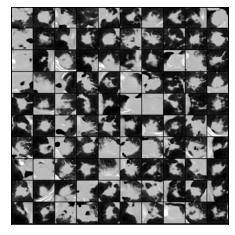

In [52]:
from torchvision.utils import make_grid
from torchvision.io import read_image
from pathlib import Path


images = [
    read_image(FAKE_PNG_IMAGES_DIR + file) for file in os.listdir(FAKE_PNG_IMAGES_DIR)
]

grid = make_grid(images, nrow=10)
show(grid)

In [42]:
from torchvision.utils import save_image

grid_min, _ = torch.min(grid, dim=1, keepdim=True)
grid_max, _ = torch.max(grid, dim=1, keepdim=True)
grid = (grid - grid_min) / (grid_max - grid_min)
save_image(grid.float(), f"{hist_type}_grid.png")

## Classifier for GAN Generated Images and Real Images

In [ ]:
len(
    os.listdir(
        "/Storage/PauloOctavioDir/splitted_folders/gan_vs_real_adeno/train/gan_vs_real_adeno"
    )
)

In [ ]:
# Generate fake data
gen_adeno = "generator_pggan_roi_adeno_all_data.pth.tar"
generate_images(
    gen_adeno, 3263, "LUAD", "/Storage/PauloOctavioDir/gan_eval/gan_vs_real_adeno"
)

In [ ]:
# Train, test, val split
splitfolders.ratio(
    input="/Storage/PauloOctavioDir/gan_eval/",
    output="/Storage/PauloOctavioDir/splitted_folders/gan_vs_real_adeno/",
    seed=1337,
    ratio=(0.8, 0.1, 0.1),
)

## Data Augmentation

NSCLC_LUSC_LUNG1-099_1-017.dcm 3


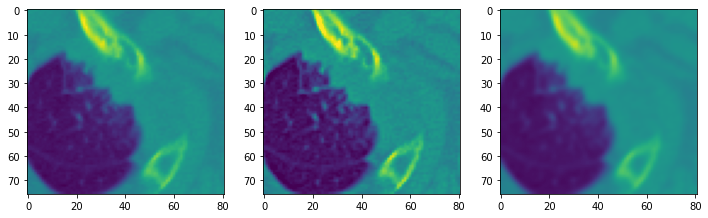

NSCLC_LUSC_LUNG1-073_1-052.dcm 3


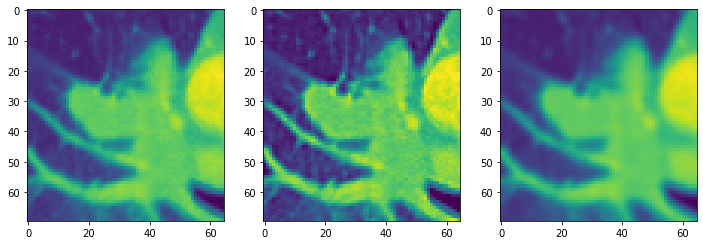

LPET_LUSC_G0039_1-209.dcm


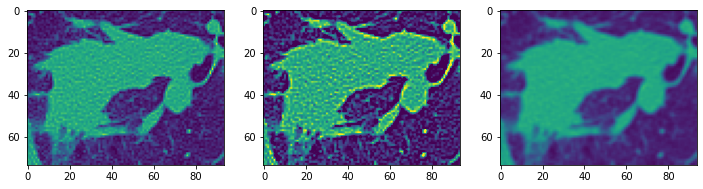

HCRP_LUSC_087_IMG0227.dcm 1.000000


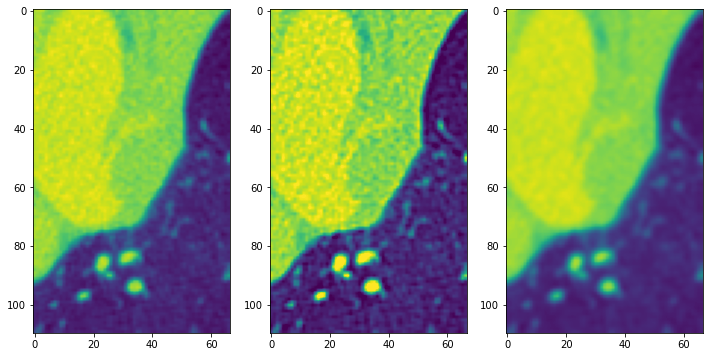

NSCLC_LUSC_LUNG1-396_1-066.dcm 3


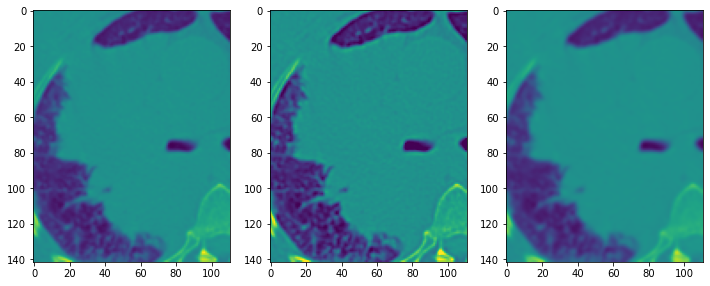

LPET_LUSC_G0004_1-29.dcm


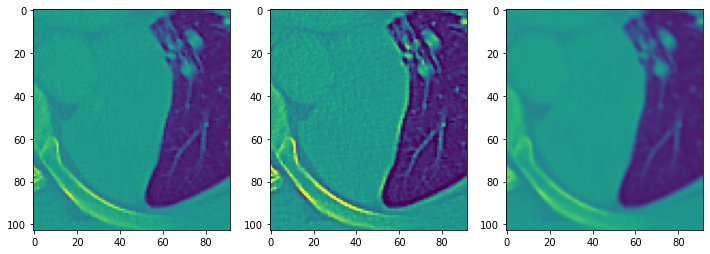

NSCLC_LUSC_LUNG1-389_1-36.dcm 3


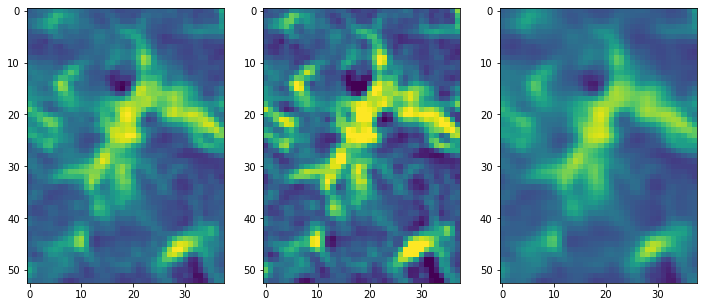

HCRP_LUSC_023_IMG0261.dcm 1.000000


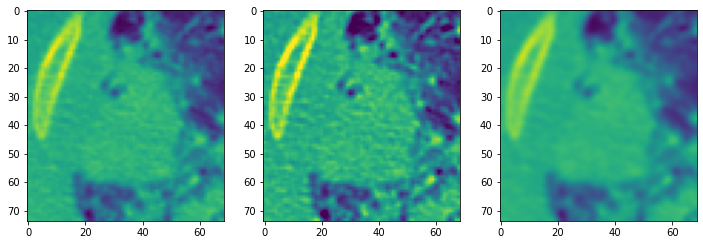

LPET_LUSC_G0057_1-200.dcm


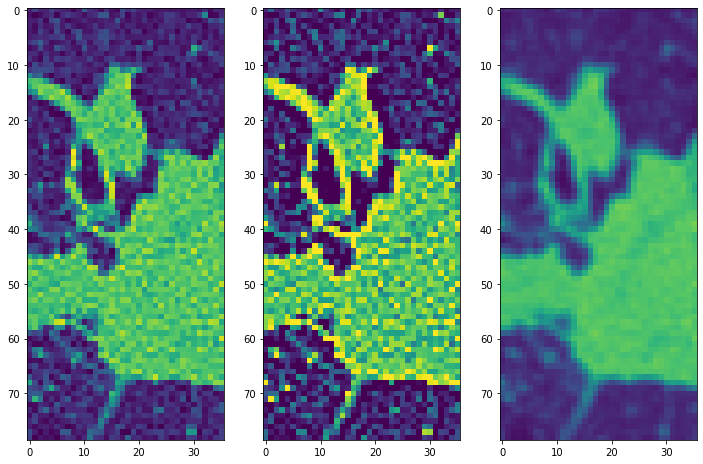

NSCLC_LUSC_LUNG1-237_1-031.dcm 3


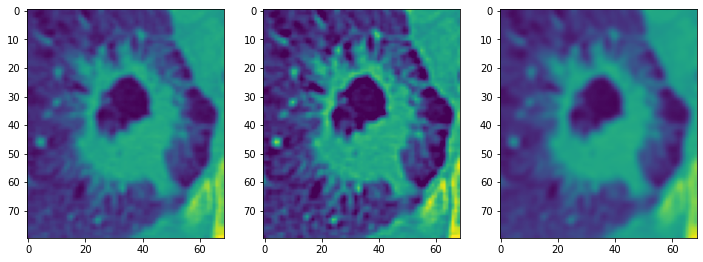

NSCLC_LUSC_LUNG1-341_1-070.dcm 3


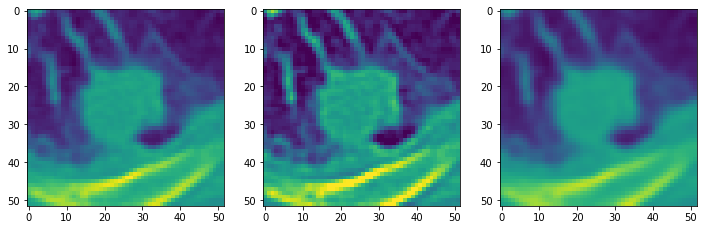

NSCLC_LUSC_LUNG1-173_1-055.dcm 3.00000


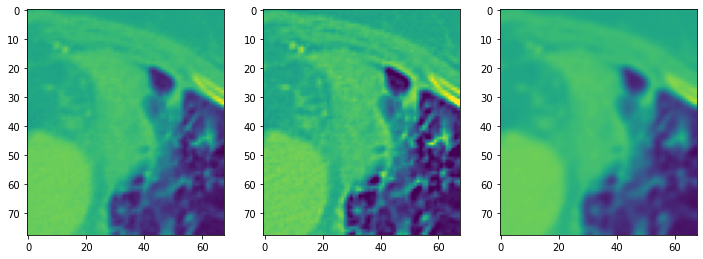

NSCLC_LUSC_LUNG1-053_1-70.dcm 3.00000


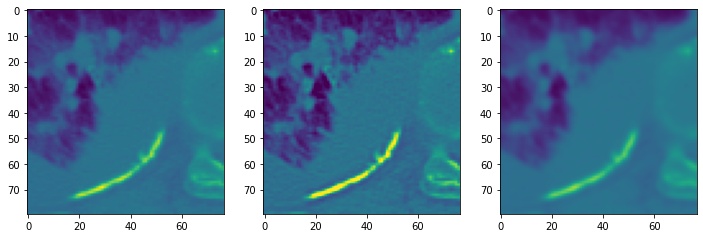

NSCLC_LUSC_LUNG1-045_1-051.dcm 3.00000


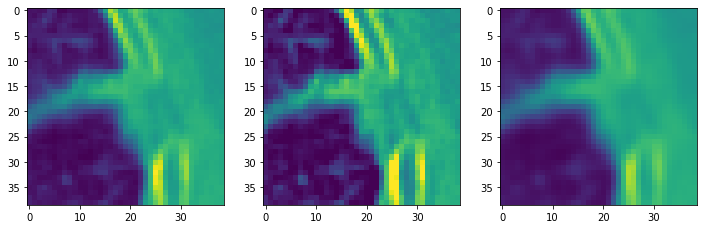

HCRP_LUSC_127_IMG0095.dcm 1.250000


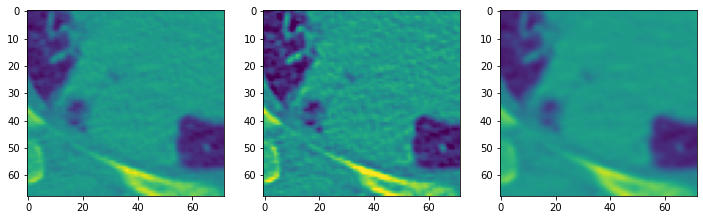

HCRP_LUSC_035_IMG0212.dcm 1.000000


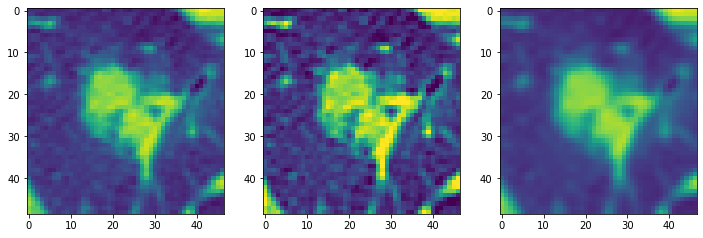

HCRP_LUSC_103_IMG0212.dcm 1.000000


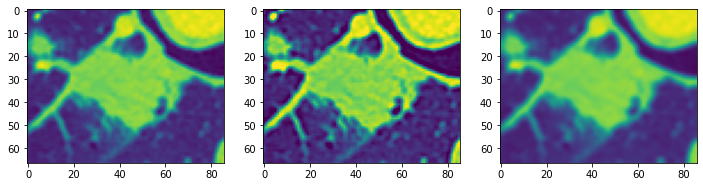

NSCLC_LUSC_LUNG1-364_1-054.dcm 3


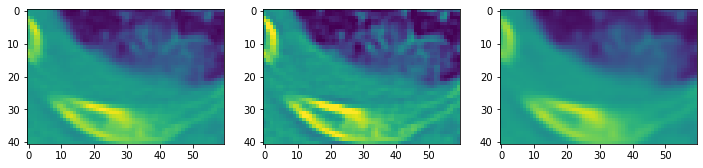

NSCLC_LUSC_LUNG1-121_1-081.dcm 3


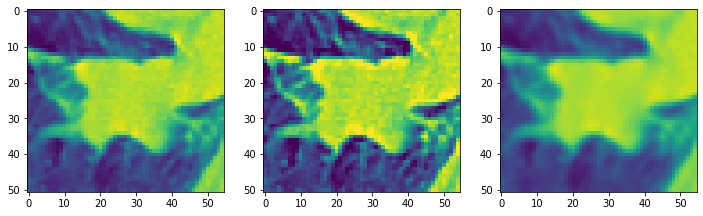

NSCLC_LUSC_LUNG1-400_1-048.dcm 3


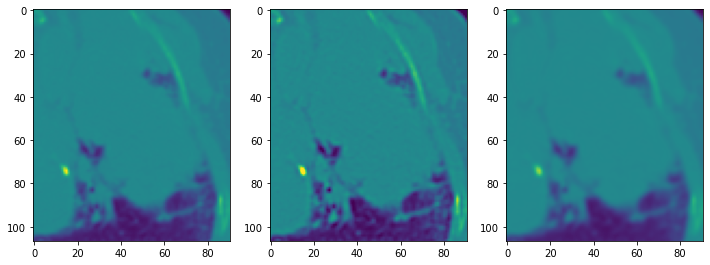

NSCLC_LUSC_LUNG1-292_1-061.dcm 3


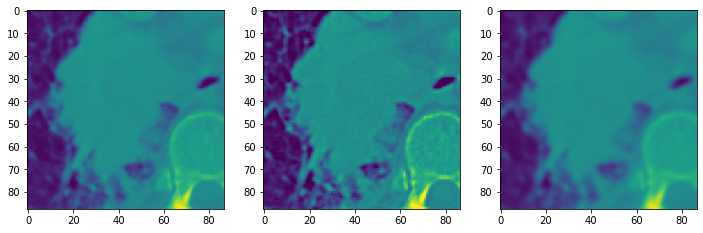

NSCLC_LUSC_LUNG1-237_1-037.dcm 3


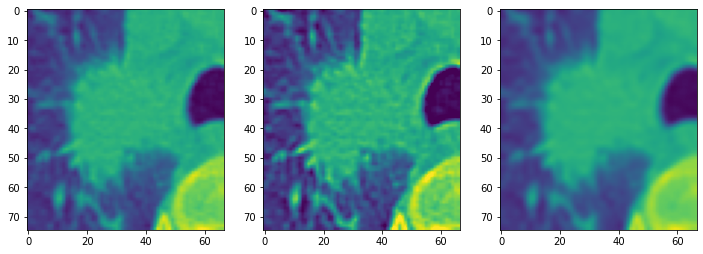

HCRP_LUSC_103_IMG0218.dcm 1.000000


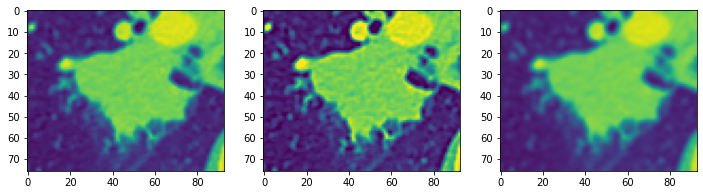

NSCLC_LUSC_LUNG1-284_1-36.dcm 3


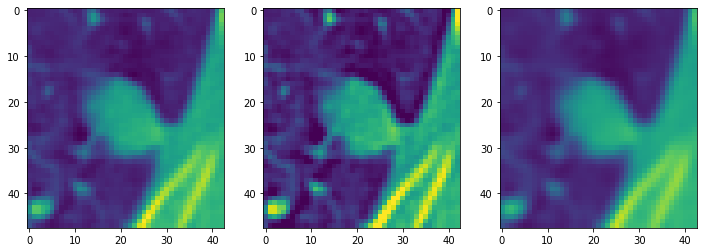

NSCLC_LUSC_LUNG1-384_1-055.dcm 3


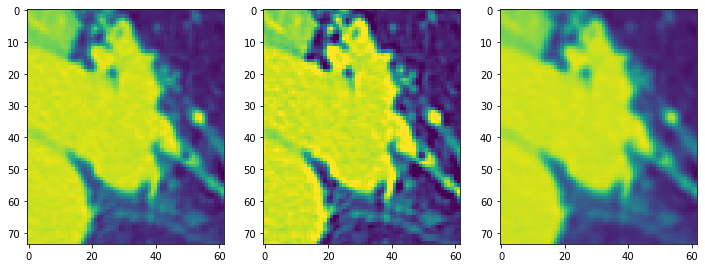

NSCLC_LUSC_LUNG1-022_1-090.dcm 3.00000


KeyboardInterrupt: 

In [257]:
for f in os.listdir(gan_dir):
    file = gan_dir + f
    data = dcmread(file)
    image = data.pixel_array.astype(np.float32)
    try:
        print(f, data.SliceThickness)
    except:
        print(f)
    _, axes = plt.subplots(1, 3, figsize=(12, 8))
    vmin = image.min()
    vmax = image.max()
    axes[0].imshow(image, vmin=vmin, vmax=vmax)
    axes[1].imshow(
        sharp_image(image, kernel_size=(5, 5)).astype(np.int16), vmin=vmin, vmax=vmax
    )
    axes[2].imshow(blur_image(image), vmin=vmin, vmax=vmax)
    plt.show()

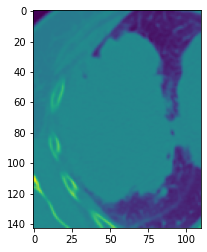

In [266]:
file = "/Storage/PauloOctavioDir/nodule_rois/gan/adeno/images/NSCLC_LUAD_LUNG1-375_1-049.dcm"
plt.imshow(dcmread(file).pixel_array)

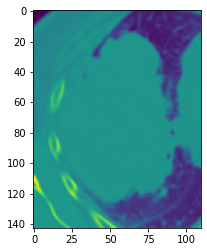

In [32]:
plt.imshow(image)

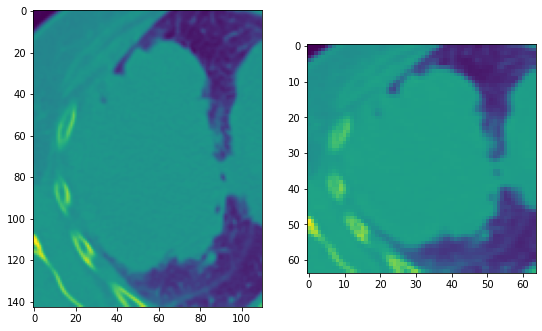

In [52]:
MIN_HU_VALUE = -1024
MAX_HU_VALUE = 1000
IMAGE_SIZE = 64


class SharpenImage:
    def __init__(self, kernel_size=(5, 5), sigma=(2.5, 2.5)):
        self.kernel_size = kernel_size
        self.sigma = sigma

    def __call__(self, x):
        x = kornia.utils.image_to_tensor(x, keepdim=False)
        sharpen = kornia.filters.UnsharpMask(self.kernel_size, self.sigma)
        sharpened_tensor = sharpen(x)
        return sharpened_tensor[0][0].numpy()


data = dcmread(
    "/Storage/PauloOctavioDir/nodule_rois/gan/adeno/images/NSCLC_LUAD_LUNG1-375_1-049.dcm"
)
image = data.pixel_array
image = np.array(data.pixel_array).astype("float32")
intercept = int(data.RescaleIntercept)
slope = int(data.RescaleSlope)
image = slope * image + intercept
image = normalize(image)
# image = image * 255
transform = transforms.Compose(
    [
        #     SharpenImage(),
        transforms.ToPILImage(),
        transforms.RandomApply(
            [transforms.GaussianBlur(kernel_size=3, sigma=2.5)], p=1
        ),
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor(),
    ]
)
trans_image = transform(image)
fig, axes = plt.subplots(1, 2, figsize=(9, 6))
axes[0].imshow(image)
axes[1].imshow(trans_image[0])
plt.show()

In [273]:
def sharp_image(image, kernel_size=(3, 3), sigma=(2.5, 2.5)):
    """ref: https://kornia-tutorials.readthedocs.io/en/latest/unsharp_mask.html"""
    data: torch.tensor = kornia.utils.image_to_tensor(image, keepdim=False)
    sharpen = kornia.filters.UnsharpMask(kernel_size, sigma)
    sharpened_tensor = sharpen(data)
    return sharpened_tensor[0][0].numpy()


def blur_image(image, radius=0.75):
    # apply Gaussian blur, creating a new image
    blurred = gaussian_filter(image, sigma=radius, mode="reflect")
    return blurred

In [272]:
print(len(os.listdir("/Storage/PauloOctavioDir/nodule_rois/gan/adeno/images/")))
print(len(os.listdir("/Storage/PauloOctavioDir/nodule_rois/gan_aug/adeno/images/")))

3263
6526


In [270]:
for hist_type in ["adeno", "squamous"]:
    gan_images_dir = f"/Storage/PauloOctavioDir/nodule_rois/gan/{hist_type}/images/"
    image_dest_fpath = (
        f"/Storage/PauloOctavioDir/nodule_rois/gan_aug/{hist_type}/images/"
    )
    images = os.listdir(gan_images_dir)
    random.shuffle(images)
    no_imgs = len(images)
    for i in range(0, no_imgs, 2):
        aug_image_name = images[i].replace(".dcm", "_AUG_B.dcm")
        image_path = gan_images_dir + images[i]
        dicom_data = dcmread(image_path)
        image = dicom_data.pixel_array
        blured_image = blur_image(image)
        write_dicom(
            blured_image,
            image_dest_fpath + aug_image_name,
            rescale_intercept=dicom_data.RescaleIntercept,
            rescale_slope=dicom_data.RescaleSlope,
            pixel_spacing=dicom_data.PixelSpacing,
        )
        shutil.copyfile(image_path, image_dest_fpath + images[i])
    for i in range(1, no_imgs, 2):
        aug_image_name = images[i].replace(".dcm", "_AUG_S.dcm")
        image_path = gan_images_dir + images[i]
        dicom_data = dcmread(image_path)
        image = dicom_data.pixel_array
        sharpened_image = sharp_image(
            image.astype(np.float32), kernel_size=(5, 5)
        ).astype(np.int16)
        write_dicom(
            sharpened_image,
            image_dest_fpath + aug_image_name,
            rescale_intercept=dicom_data.RescaleIntercept,
            rescale_slope=dicom_data.RescaleSlope,
            pixel_spacing=dicom_data.PixelSpacing,
        )
        shutil.copyfile(image_path, image_dest_fpath + images[i])

LPET_LUAD_A0179_1-229_AUG_B.dcm


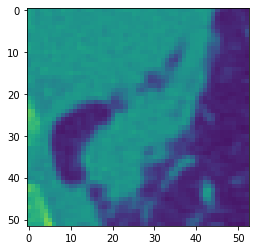

LPET_LUAD_A0124_1-07_AUG_B.dcm


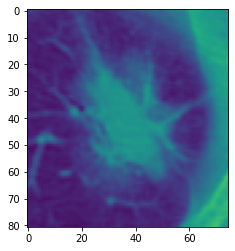

NSCLC_LUAD_LUNG1-123_1-046.dcm


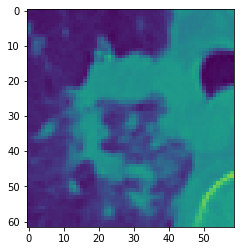

LPET_LUAD_A0164_1-169_AUG_B.dcm


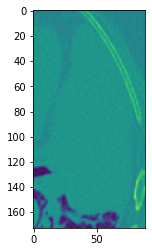

LPET_LUAD_A0139_1-21_AUG_S.dcm


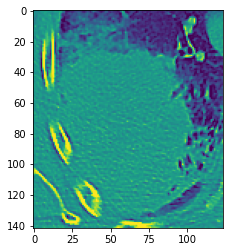

NSCLC_LUAD_LUNG1-392_1-038.dcm


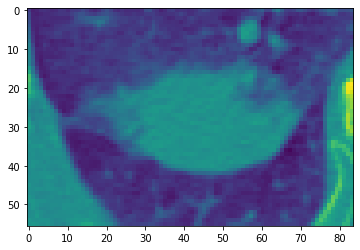

NSCLC_LUAD_LUNG1-239_1-074_AUG_B.dcm


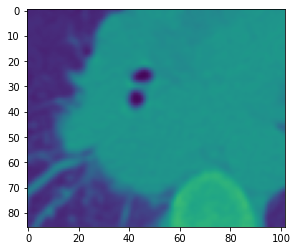

LPET_LUAD_A0065_1-38_AUG_B.dcm


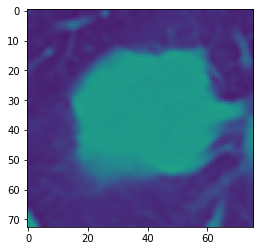

NSCLC_LUAD_LUNG1-144_1-074_AUG_B.dcm


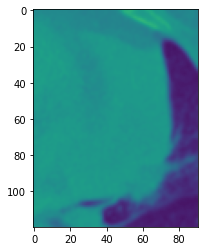

HCRP_LUAD_058_IMG0169.dcm


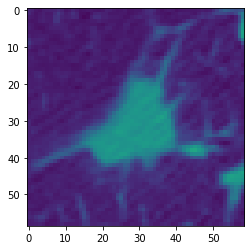

LPET_LUAD_A0034_1-22_AUG_B.dcm


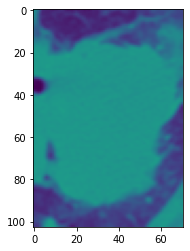

NSCLC_LUAD_LUNG1-143_1-067.dcm


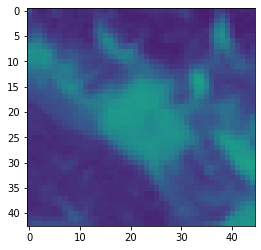

HCRP_LUAD_008_IMG0146_AUG_S.dcm


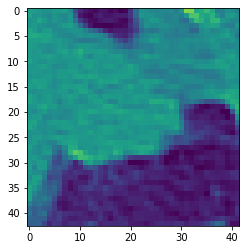

HCRP_LUAD_012_IMG0196_AUG_B.dcm


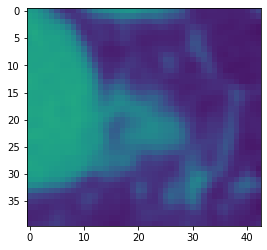

HCRP_LUAD_025_IMG0264.dcm


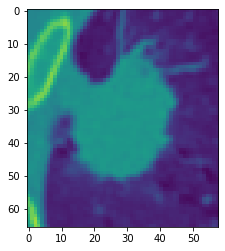

NSCLC_LUAD_LUNG1-025_1-011_AUG_S.dcm


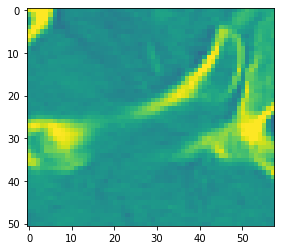

HCRP_LUAD_084_IMG0208_AUG_B.dcm


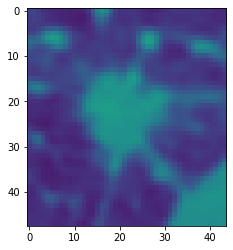

HCRP_LUAD_019_IMG0119_AUG_B.dcm


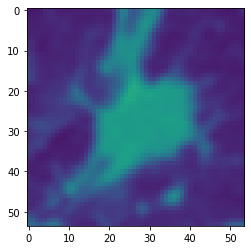

LPET_LUAD_A0108_1-06.dcm


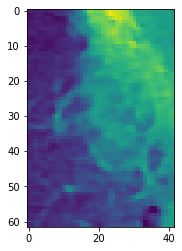

LPET_LUAD_A0073_1-17.dcm


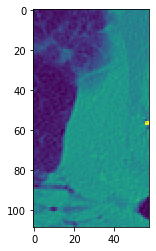

HCRP_LUAD_045_IMG0278_AUG_B.dcm


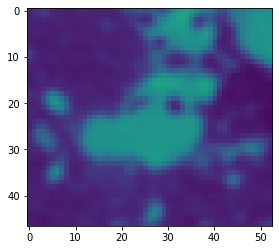

NSCLC_LUAD_LUNG1-026_1-074_AUG_S.dcm


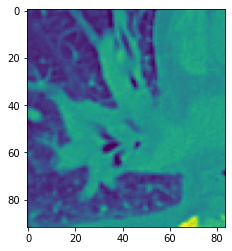

LPET_LUAD_A0164_1-175_AUG_S.dcm


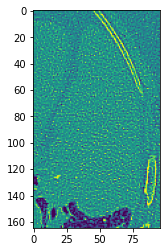

HCRP_LUAD_117_IMG0266.dcm


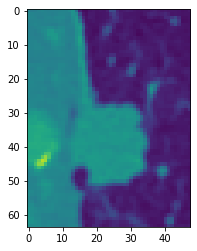

HCRP_LUAD_017_IMG0178_AUG_S.dcm


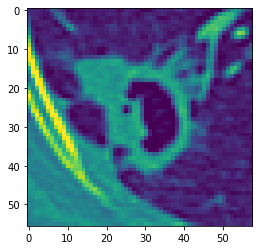

HCRP_LUAD_078_IMG0183.dcm


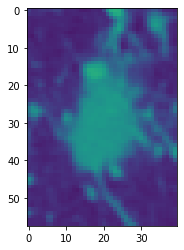

NSCLC_LUAD_LUNG1-123_1-026.dcm


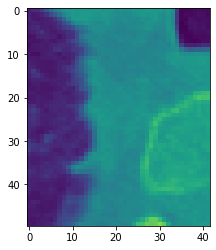

LPET_LUAD_A0081_1-37_AUG_B.dcm


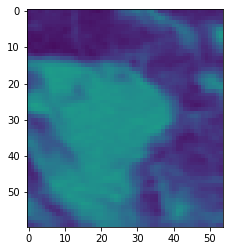

NSCLC_LUAD_LUNG1-025_1-033.dcm


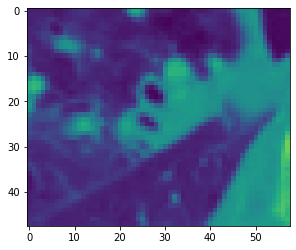

LPET_LUAD_A0101_1-14.dcm


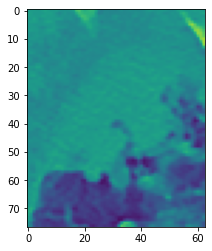

HCRP_LUAD_058_IMG0165_AUG_B.dcm


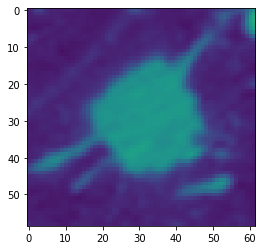

NSCLC_LUAD_LUNG1-373_1-54.dcm


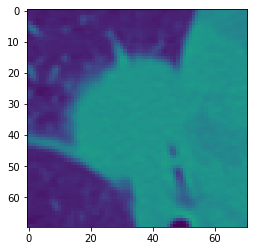

HCRP_LUAD_072_IMG0119_AUG_S.dcm


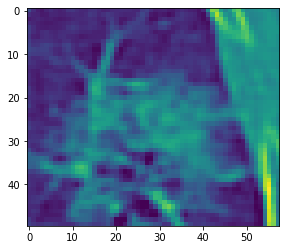

HCRP_LUAD_088_IMG0099.dcm


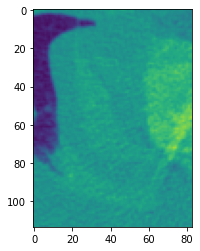

LPET_LUAD_A0164_1-096.dcm


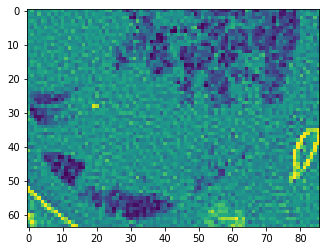

HCRP_LUAD_111_IMG0141_AUG_B.dcm


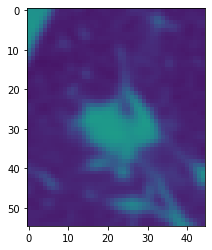

LPET_LUAD_A0164_1-115.dcm


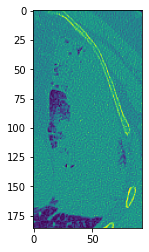

NSCLC_LUAD_LUNG1-131_1-071.dcm


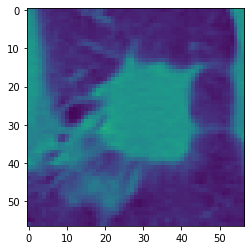

NSCLC_LUAD_LUNG1-318_1-045_AUG_B.dcm


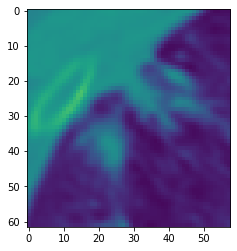

LPET_LUAD_A0020_1-017.dcm


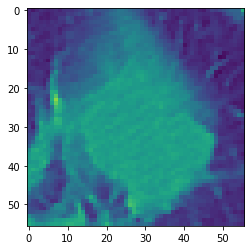

HCRP_LUAD_012_IMG0192.dcm


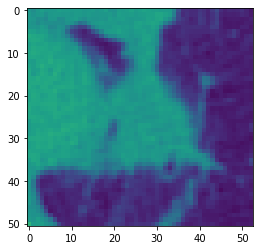

LPET_LUAD_A0164_1-165_AUG_B.dcm


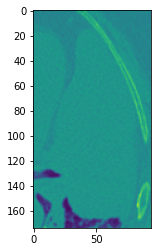

LPET_LUAD_A0161_1-08.dcm


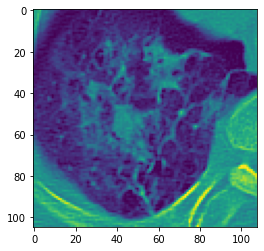

NSCLC_LUAD_LUNG1-143_1-064_AUG_S.dcm


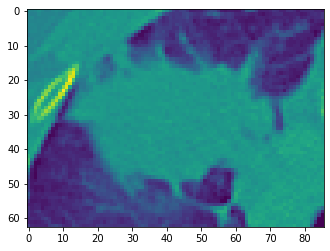

HCRP_LUAD_054_IMG0143_AUG_S.dcm


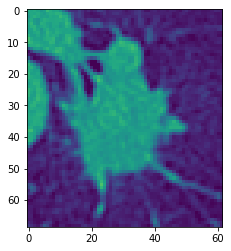

HCRP_LUAD_036_IMG0177_AUG_B.dcm


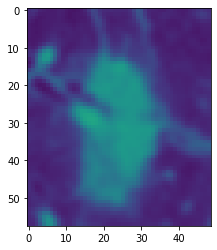

LPET_LUAD_A0102_1-08.dcm


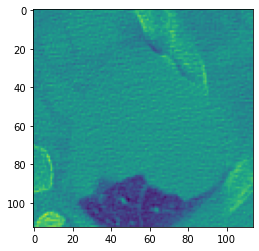

HCRP_LUAD_042_IMG0257_AUG_B.dcm


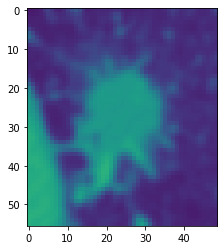

HCRP_LUAD_073_IMG0176.dcm


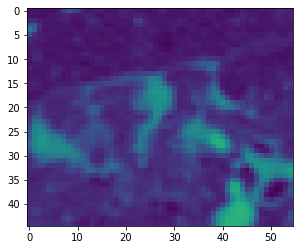

NSCLC_LUAD_LUNG1-026_1-055.dcm


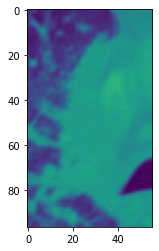

LPET_LUAD_A0164_1-205.dcm


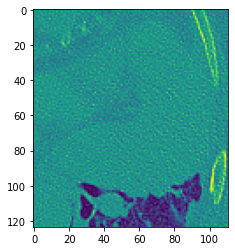

LPET_LUAD_A0164_1-140.dcm


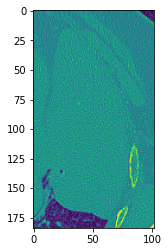

NSCLC_LUAD_LUNG1-025_1-031.dcm


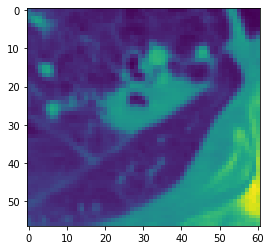

NSCLC_LUAD_LUNG1-095_1-044.dcm


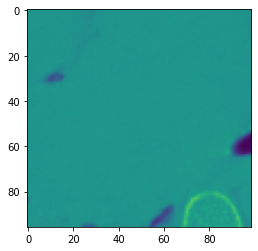

LPET_LUAD_A0051_1-21.dcm


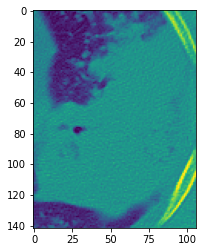

HCRP_LUAD_045_IMG0300_AUG_B.dcm


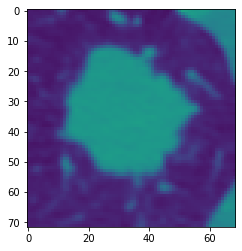

NSCLC_LUAD_LUNG1-052_1-095.dcm


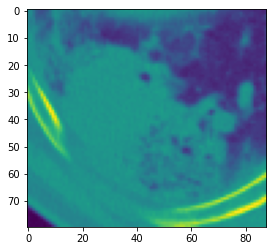

NSCLC_LUAD_LUNG1-144_1-064.dcm


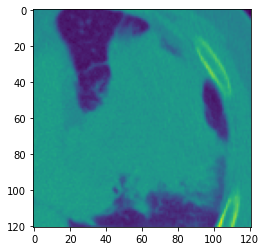

HCRP_LUAD_007_IMG0191.dcm


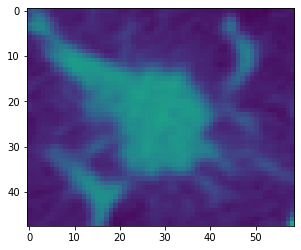

HCRP_LUAD_058_IMG0169_AUG_S.dcm


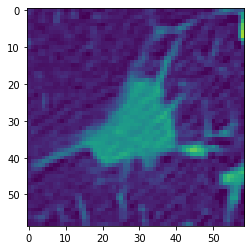

LPET_LUAD_A0048_1-32.dcm


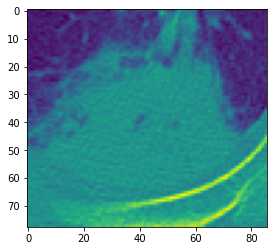

HCRP_LUAD_034_IMG0231_AUG_B.dcm


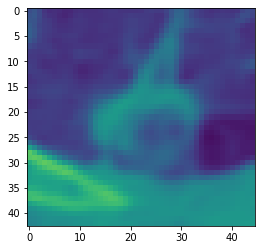

LPET_LUAD_A0164_1-110_AUG_S.dcm


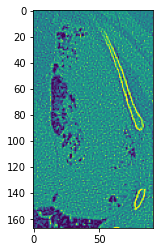

LPET_LUAD_A0150_2-034_AUG_S.dcm


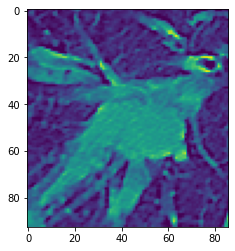

HCRP_LUAD_054_IMG0149_AUG_S.dcm


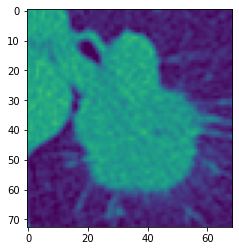

LPET_LUAD_A0028_1-20.dcm


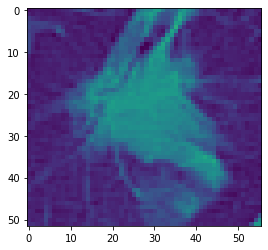

LPET_LUAD_A0164_1-079_AUG_S.dcm


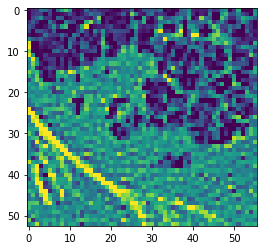

LPET_LUAD_A0108_1-20.dcm


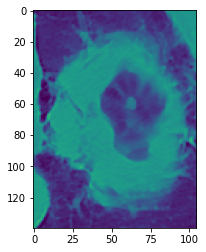

LPET_LUAD_A0114_1-43.dcm


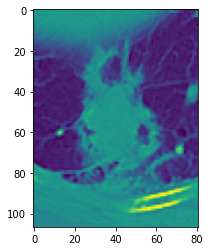

HCRP_LUAD_041_IMG0269_AUG_S.dcm


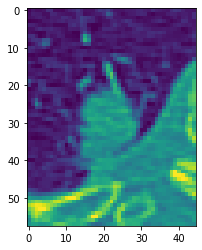

HCRP_LUAD_088_IMG0170.dcm


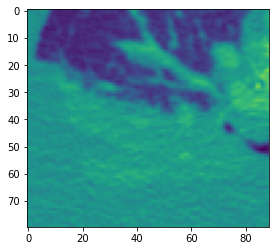

LPET_LUAD_A0081_1-38.dcm


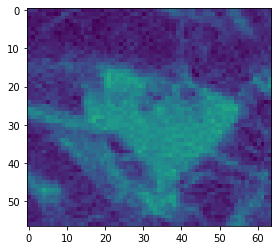

NSCLC_LUAD_LUNG1-375_1-030_AUG_B.dcm


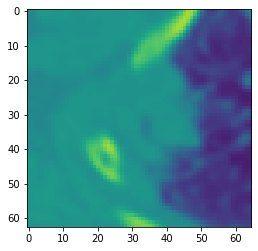

LPET_LUAD_A0130_1-35.dcm


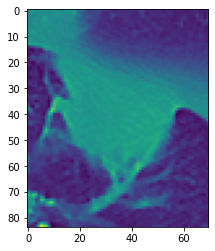

HCRP_LUAD_031_IMG0180.dcm


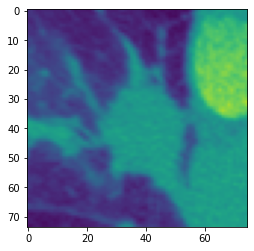

LPET_LUAD_A0147_1-13_AUG_S.dcm


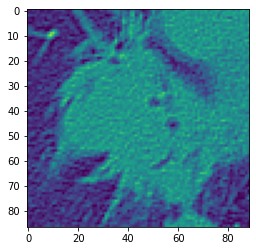

NSCLC_LUAD_LUNG1-285_1-69.dcm


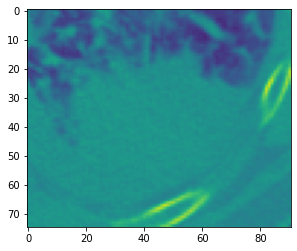

NSCLC_LUAD_LUNG1-300_1-056.dcm


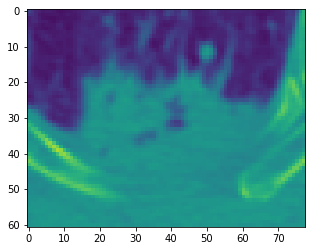

NSCLC_LUAD_LUNG1-197_1-071_AUG_S.dcm


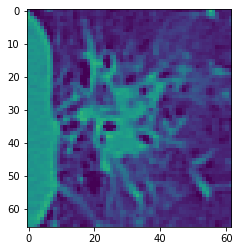

HCRP_LUAD_025_IMG0248.dcm


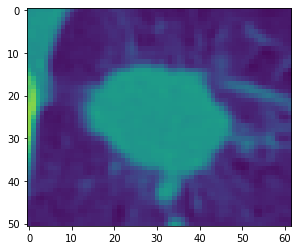

NSCLC_LUAD_LUNG1-025_1-033_AUG_S.dcm


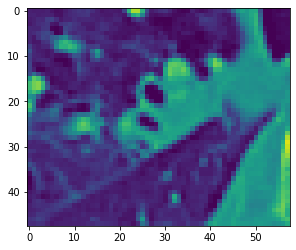

LPET_LUAD_A0128_1-14.dcm


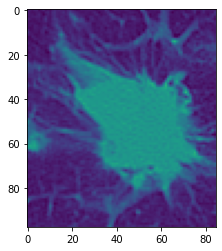

LPET_LUAD_A0164_1-128_AUG_B.dcm


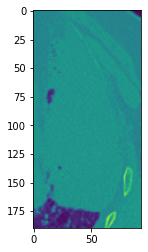

NSCLC_LUAD_LUNG1-318_1-047_AUG_B.dcm


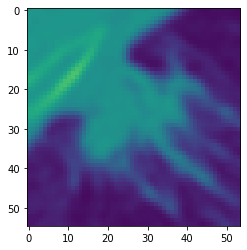

LPET_LUAD_A0179_1-287.dcm


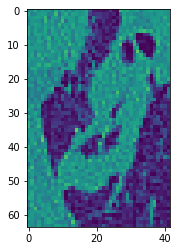

HCRP_LUAD_118_IMG0227_AUG_S.dcm


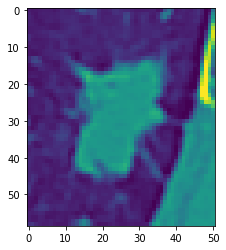

LPET_LUAD_A0164_1-120_AUG_S.dcm


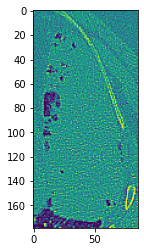

HCRP_LUAD_075_IMG0065.dcm


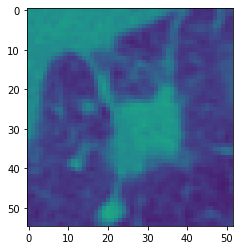

LPET_LUAD_A0164_1-233.dcm


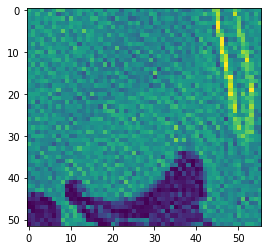

HCRP_LUAD_070_IMG0141.dcm


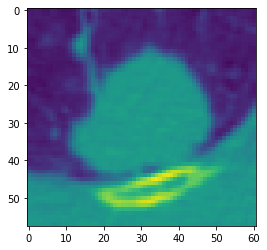

LPET_LUAD_A0073_1-14.dcm


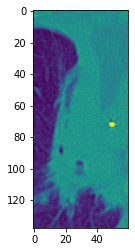

LPET_LUAD_A0164_1-216.dcm


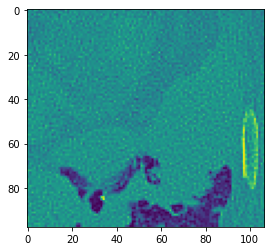

HCRP_LUAD_009_IMG0264_AUG_S.dcm


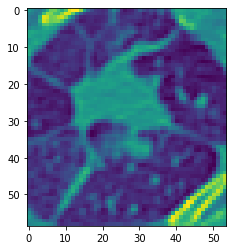

LPET_LUAD_A0130_1-30_AUG_S.dcm


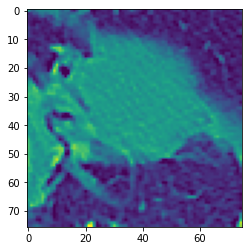

HCRP_LUAD_054_IMG0151.dcm


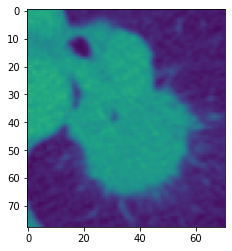

HCRP_LUAD_072_IMG0118.dcm


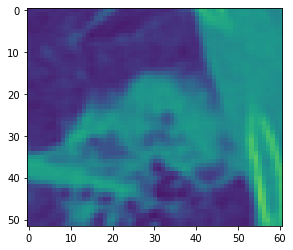

LPET_LUAD_A0048_1-32_AUG_B.dcm


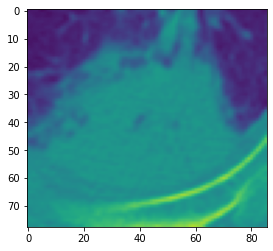

LPET_LUAD_A0155_1-24_AUG_S.dcm


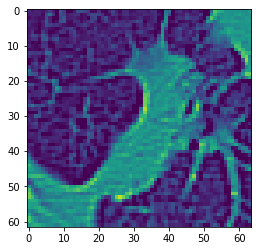

LPET_LUAD_A0162_1-015_AUG_S.dcm


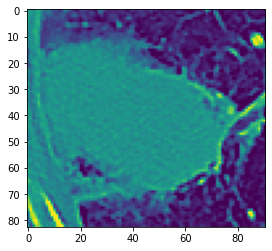

NSCLC_LUAD_LUNG1-026_1-052.dcm


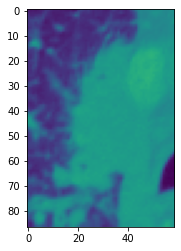

LPET_LUAD_A0114_1-45_AUG_B.dcm


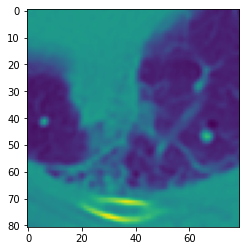

HCRP_LUAD_033_IMG0172_AUG_B.dcm


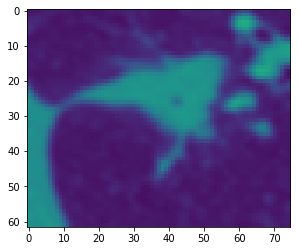

HCRP_LUAD_050_IMG0117_AUG_B.dcm


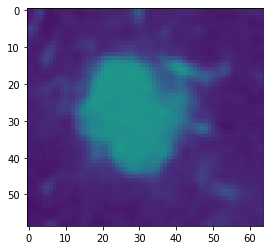

LPET_LUAD_A0085_1-40.dcm


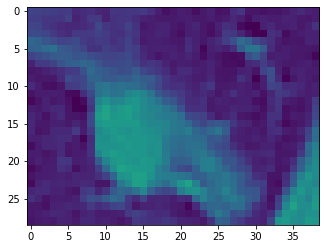

HCRP_LUAD_109_IMG0301_AUG_S.dcm


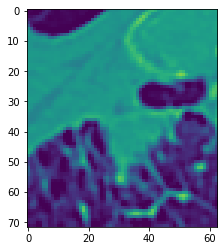

HCRP_LUAD_034_IMG0231.dcm


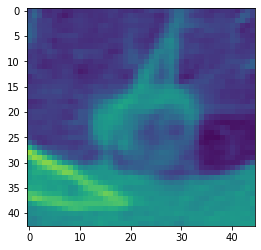

HCRP_LUAD_048_IMG0333_AUG_B.dcm


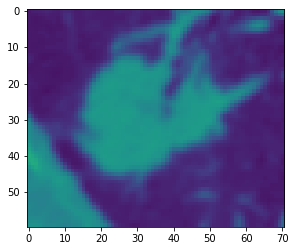

HCRP_LUAD_086_IMG0151.dcm


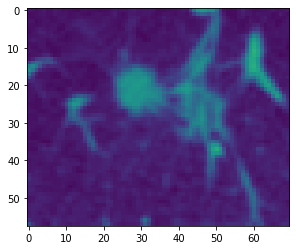

HCRP_LUAD_123_IMG0214.dcm


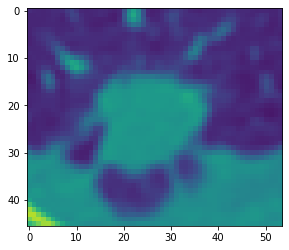

NSCLC_LUAD_LUNG1-024_1-37_AUG_B.dcm


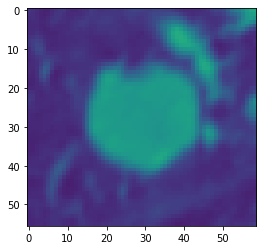

NSCLC_LUAD_LUNG1-239_1-063.dcm


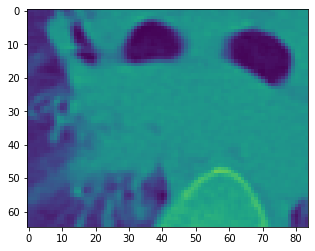

LPET_LUAD_A0164_1-161_AUG_S.dcm


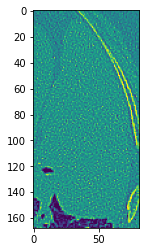

LPET_LUAD_A0148_1-20_AUG_B.dcm


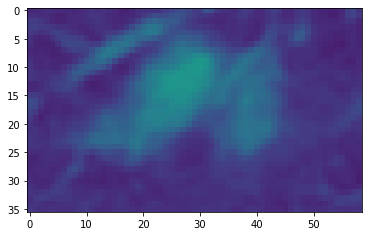

HCRP_LUAD_034_IMG0232_AUG_B.dcm


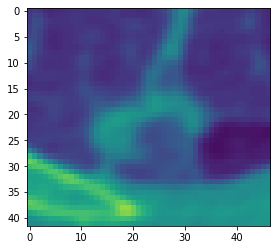

HCRP_LUAD_033_IMG0175.dcm


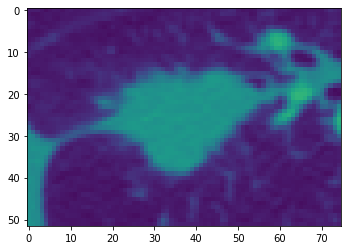

NSCLC_LUAD_LUNG1-026_1-036_AUG_B.dcm


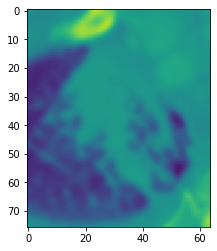

HCRP_LUAD_123_IMG0216_AUG_S.dcm


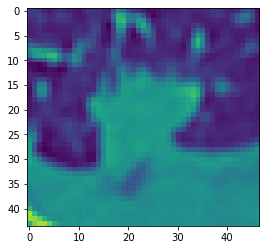

HCRP_LUAD_073_IMG0149.dcm


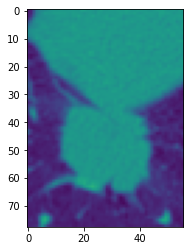

HCRP_LUAD_067_IMG0240.dcm


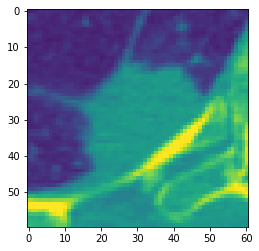

HCRP_LUAD_064_IMG0264_AUG_B.dcm


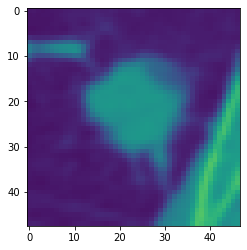

HCRP_LUAD_088_IMG0173.dcm


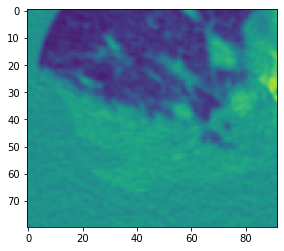

NSCLC_LUAD_LUNG1-203_1-046_AUG_B.dcm


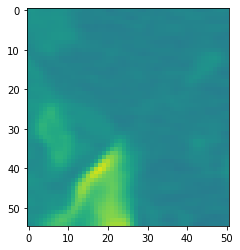

HCRP_LUAD_095_IMG0258.dcm


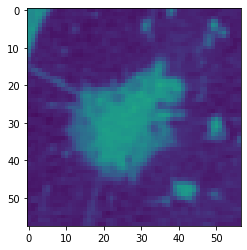

NSCLC_LUAD_LUNG1-349_1-053_AUG_S.dcm


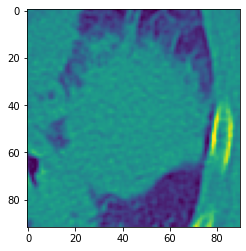

NSCLC_LUAD_LUNG1-203_1-054.dcm


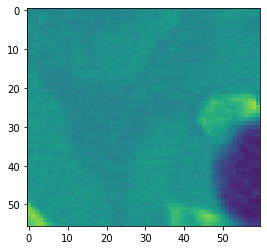

HCRP_LUAD_078_IMG0182_AUG_B.dcm


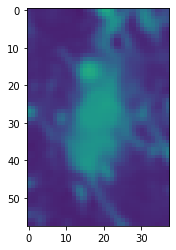

NSCLC_LUAD_LUNG1-107_1-042_AUG_S.dcm


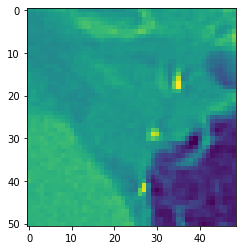

HCRP_LUAD_007_IMG0188.dcm


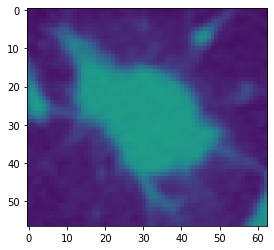

NSCLC_LUAD_LUNG1-349_1-053.dcm


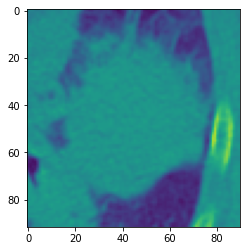

HCRP_LUAD_048_IMG0349_AUG_S.dcm


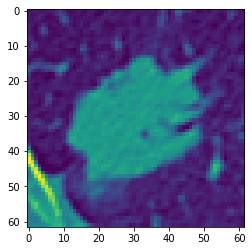

LPET_LUAD_A0074_1-14_AUG_B.dcm


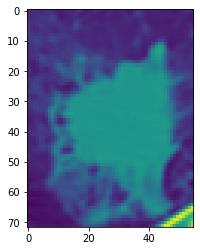

NSCLC_LUAD_LUNG1-395_1-081_AUG_B.dcm


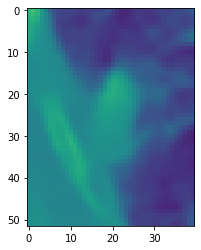

LPET_LUAD_A0179_1-247_AUG_B.dcm


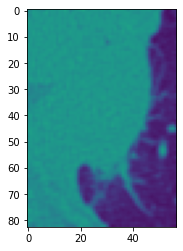

NSCLC_LUAD_LUNG1-388_1-081_AUG_S.dcm


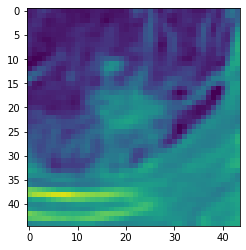

LPET_LUAD_A0114_1-38.dcm


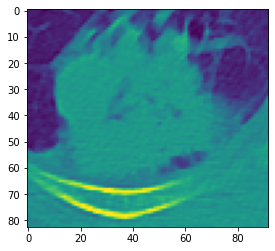

NSCLC_LUAD_LUNG1-025_1-026_AUG_S.dcm


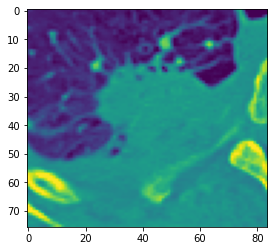

HCRP_LUAD_070_IMG0154_AUG_S.dcm


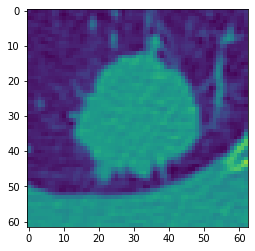

NSCLC_LUAD_LUNG1-418_1-049_AUG_S.dcm


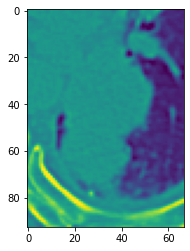

HCRP_LUAD_070_IMG0144.dcm


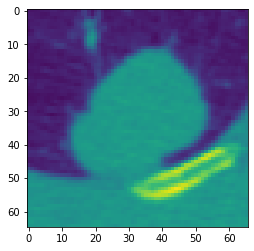

HCRP_LUAD_093_IMG0097.dcm


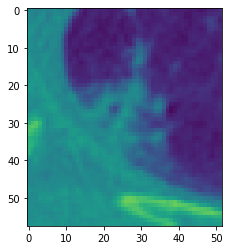

HCRP_LUAD_021_IMG0287_AUG_S.dcm


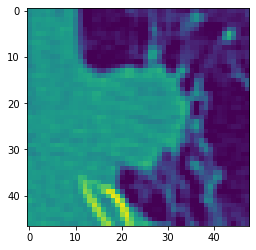

LPET_LUAD_A0164_1-170_AUG_B.dcm


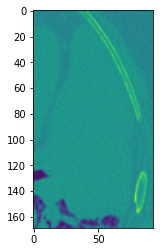

NSCLC_LUAD_LUNG1-418_1-045_AUG_S.dcm


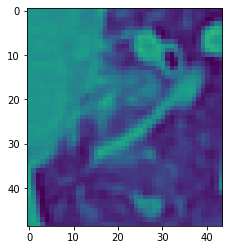

LPET_LUAD_A0179_1-279.dcm


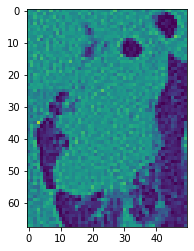

LPET_LUAD_A0164_1-211_AUG_B.dcm


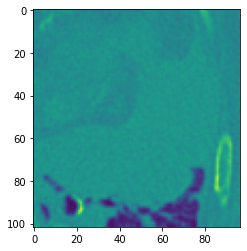

NSCLC_LUAD_LUNG1-392_1-031.dcm


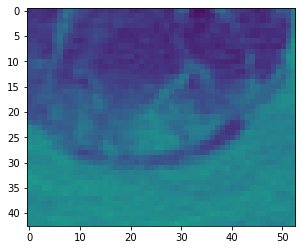

HCRP_LUAD_064_IMG0263.dcm


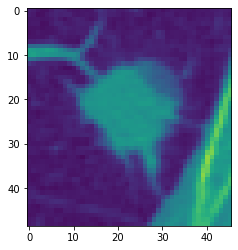

HCRP_LUAD_042_IMG0265.dcm


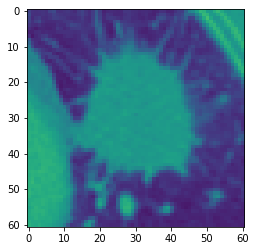

NSCLC_LUAD_LUNG1-410_1-042_AUG_S.dcm


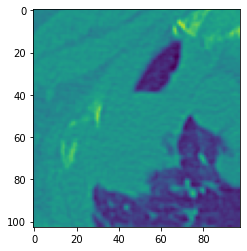

LPET_LUAD_A0152_1-10.dcm


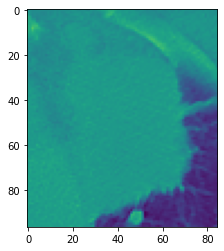

HCRP_LUAD_009_IMG0252_AUG_S.dcm


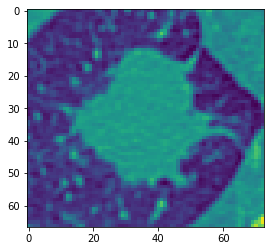

NSCLC_LUAD_LUNG1-317_1-031.dcm


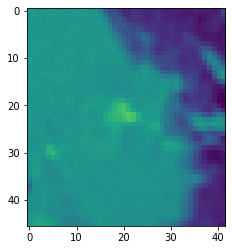

HCRP_LUAD_088_IMG0168_AUG_B.dcm


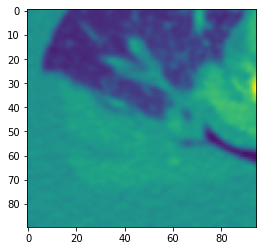

HCRP_LUAD_043_IMG0292.dcm


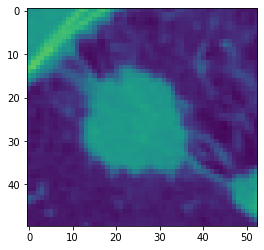

HCRP_LUAD_017_IMG0168_AUG_S.dcm


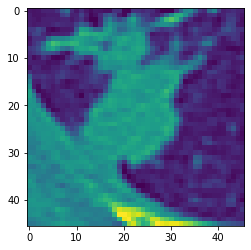

HCRP_LUAD_095_IMG0258_AUG_S.dcm


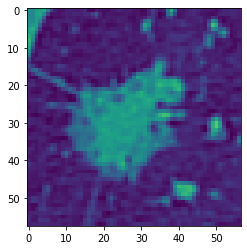

HCRP_LUAD_027_IMG0179.dcm


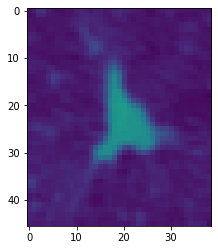

NSCLC_LUAD_LUNG1-349_1-041_AUG_B.dcm


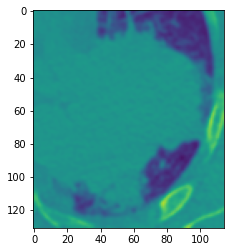

HCRP_LUAD_041_IMG0260.dcm


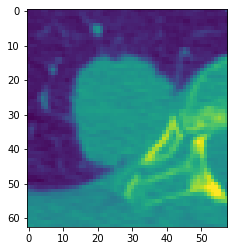

HCRP_LUAD_048_IMG0332_AUG_S.dcm


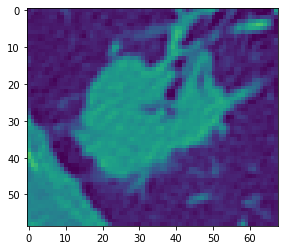

HCRP_LUAD_088_IMG0145_AUG_S.dcm


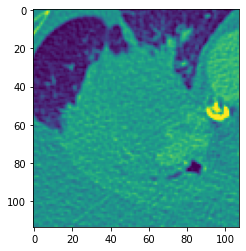

LPET_LUAD_A0031_1-37.dcm


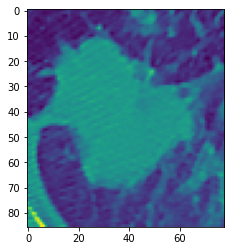

LPET_LUAD_A0072_1-09.dcm


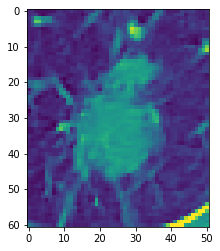

HCRP_LUAD_041_IMG0267_AUG_S.dcm


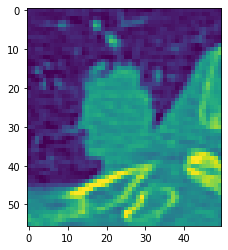

NSCLC_LUAD_LUNG1-131_1-069.dcm


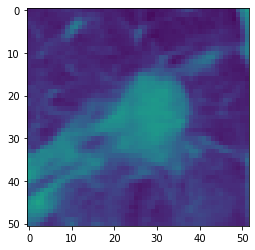

LPET_LUAD_A0179_1-260.dcm


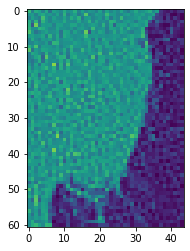

NSCLC_LUAD_LUNG1-375_1-039.dcm


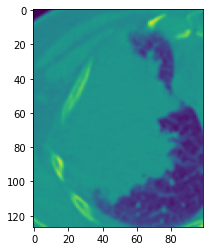

HCRP_LUAD_083_IMG0164.dcm


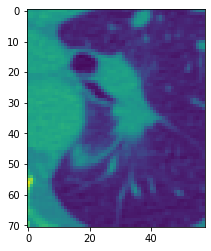

NSCLC_LUAD_LUNG1-089_1-41_AUG_B.dcm


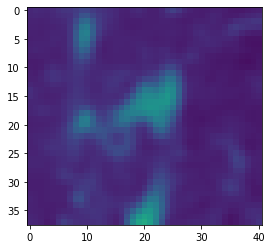

HCRP_LUAD_012_IMG0178.dcm


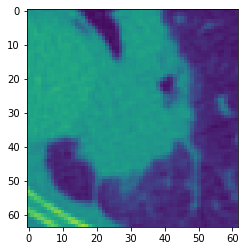

NSCLC_LUAD_LUNG1-349_1-033.dcm


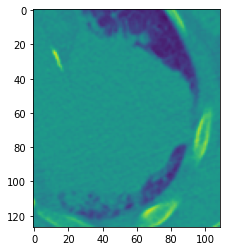

NSCLC_LUAD_LUNG1-300_1-055_AUG_S.dcm


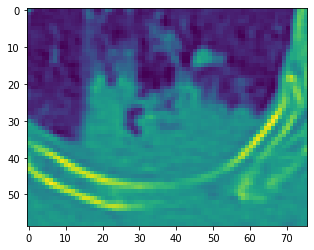

HCRP_LUAD_025_IMG0253_AUG_B.dcm


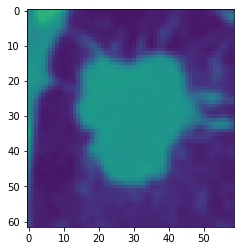

LPET_LUAD_A0002_1-13_AUG_S.dcm


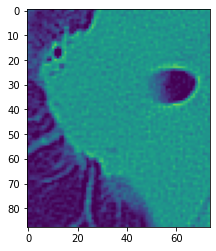

LPET_LUAD_A0168_1-071.dcm


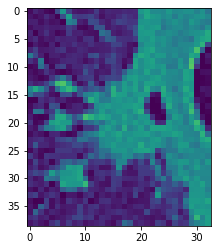

NSCLC_LUAD_LUNG1-418_1-045.dcm


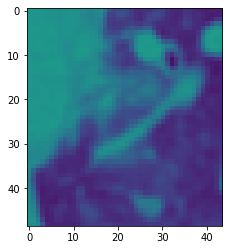

LPET_LUAD_A0164_1-224_AUG_B.dcm


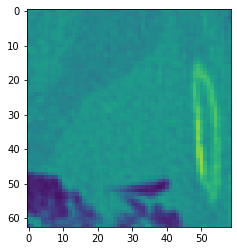

HCRP_LUAD_025_IMG0266.dcm


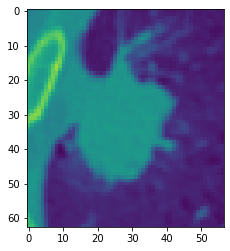

HCRP_LUAD_022_IMG0233.dcm


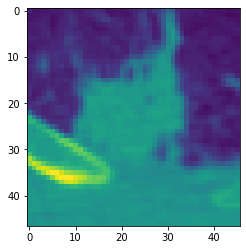

NSCLC_LUAD_LUNG1-144_1-075_AUG_S.dcm


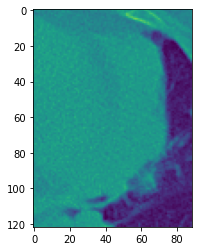

LPET_LUAD_A0032_1-24_AUG_S.dcm


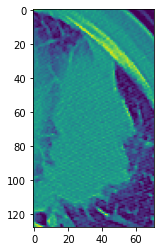

HCRP_LUAD_048_IMG0342_AUG_B.dcm


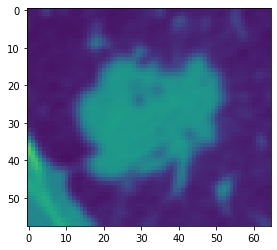

HCRP_LUAD_017_IMG0197_AUG_S.dcm


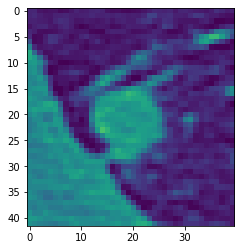

HCRP_LUAD_031_IMG0152.dcm


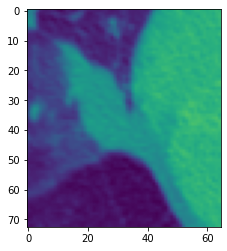

NSCLC_LUAD_LUNG1-025_1-025.dcm


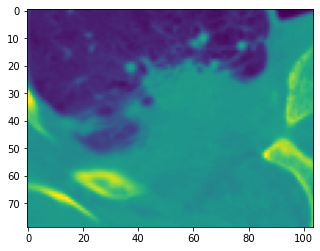

HCRP_LUAD_025_IMG0250_AUG_B.dcm


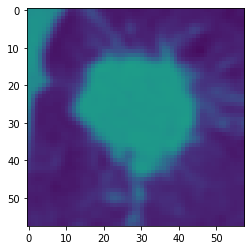

NSCLC_LUAD_LUNG1-034_1-29.dcm


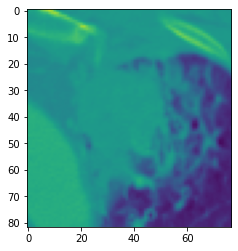

HCRP_LUAD_088_IMG0148.dcm


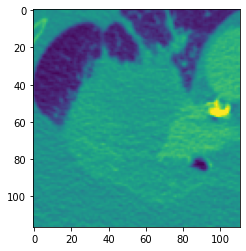

HCRP_LUAD_042_IMG0279.dcm


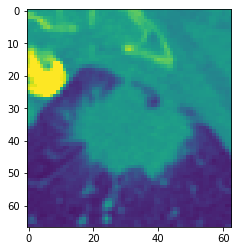

LPET_LUAD_A0059_1-42_AUG_S.dcm


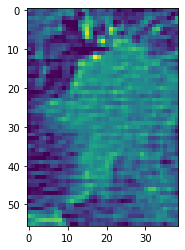

HCRP_LUAD_057_IMG0247_AUG_S.dcm


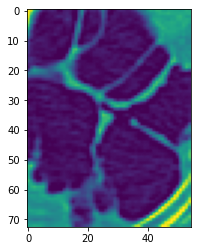

LPET_LUAD_A0128_1-18.dcm


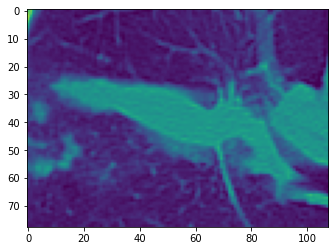

LPET_LUAD_A0085_1-31_AUG_S.dcm


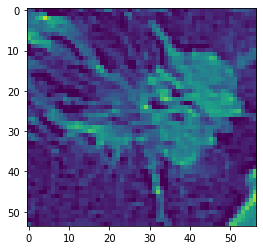

HCRP_LUAD_088_IMG0132.dcm


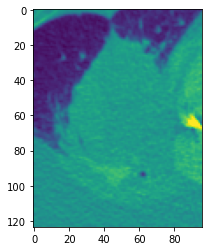

HCRP_LUAD_042_IMG0288_AUG_S.dcm


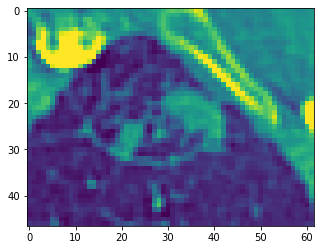

HCRP_LUAD_085_IMG0313.dcm


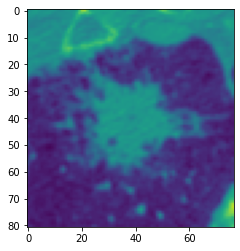

HCRP_LUAD_025_IMG0246.dcm


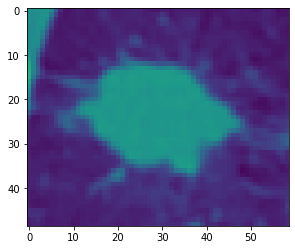

NSCLC_LUAD_LUNG1-123_1-037_AUG_B.dcm


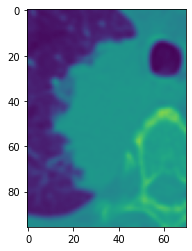

NSCLC_LUAD_LUNG1-314_1-40.dcm


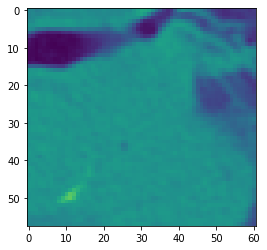

LPET_LUAD_A0092_1-31.dcm


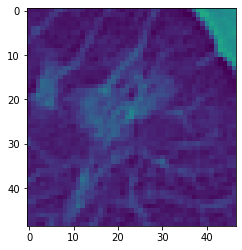

NSCLC_LUAD_LUNG1-008_1-042_AUG_B.dcm


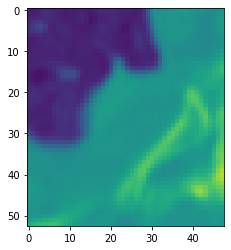

HCRP_LUAD_083_IMG0138_AUG_S.dcm


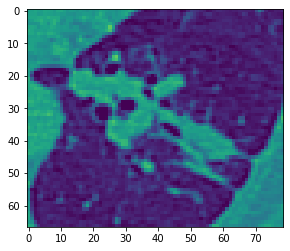

LPET_LUAD_A0139_1-23.dcm


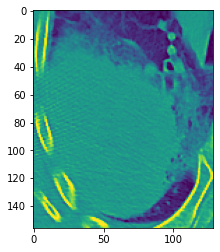

HCRP_LUAD_017_IMG0193.dcm


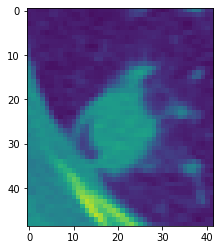

NSCLC_LUAD_LUNG1-285_1-64_AUG_B.dcm


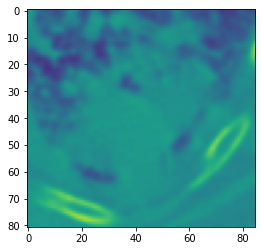

HCRP_LUAD_022_IMG0247.dcm


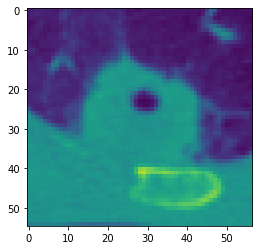

LPET_LUAD_A0142_1-12.dcm


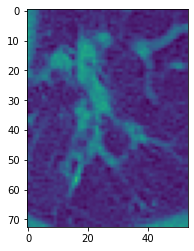

NSCLC_LUAD_LUNG1-239_1-056_AUG_S.dcm


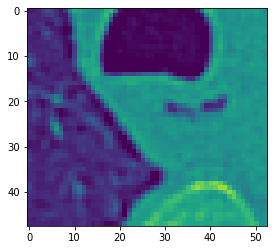

HCRP_LUAD_117_IMG0263_AUG_S.dcm


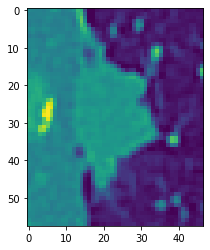

LPET_LUAD_A0139_1-28.dcm


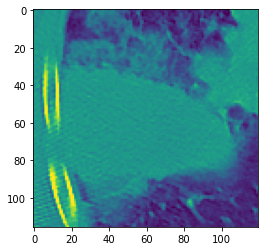

HCRP_LUAD_036_IMG0174_AUG_S.dcm


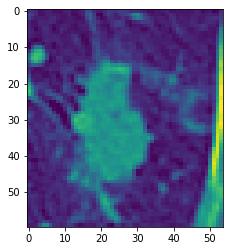

HCRP_LUAD_088_IMG0160_AUG_B.dcm


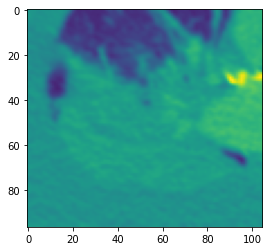

LPET_LUAD_A0066_1-11_AUG_S.dcm


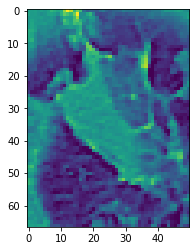

LPET_LUAD_A0179_1-250_AUG_B.dcm


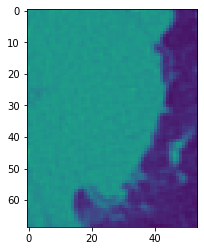

LPET_LUAD_A0114_1-40.dcm


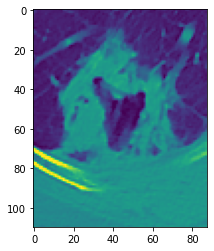

HCRP_LUAD_036_IMG0169_AUG_S.dcm


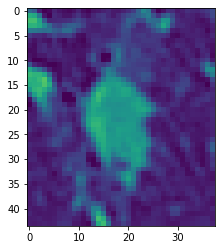

NSCLC_LUAD_LUNG1-052_1-092_AUG_S.dcm


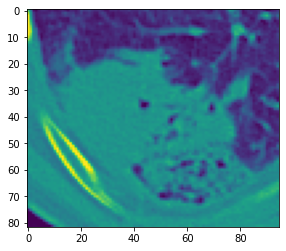

HCRP_LUAD_093_IMG0096_AUG_S.dcm


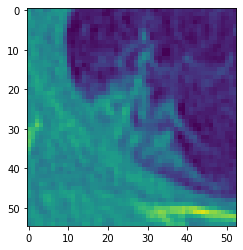

NSCLC_LUAD_LUNG1-041_1-052_AUG_S.dcm


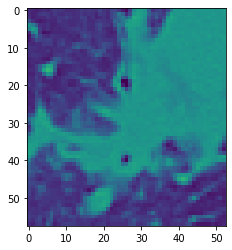

NSCLC_LUAD_LUNG1-233_1-055.dcm


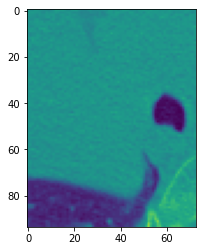

HCRP_LUAD_047_IMG0308.dcm


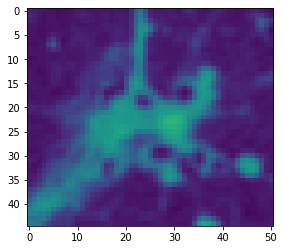

NSCLC_LUAD_LUNG1-373_1-50.dcm


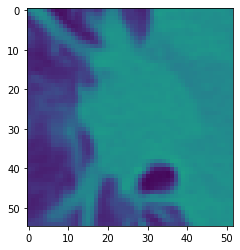

HCRP_LUAD_007_IMG0182.dcm


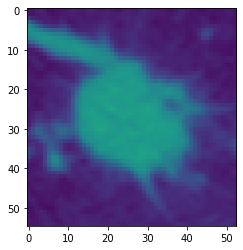

HCRP_LUAD_123_IMG0213_AUG_B.dcm


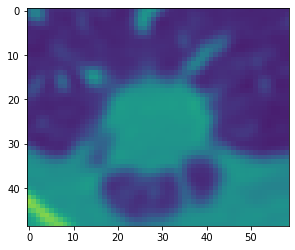

NSCLC_LUAD_LUNG1-314_1-44.dcm


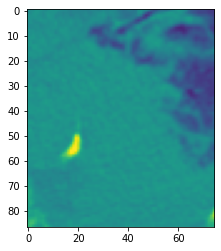

HCRP_LUAD_058_IMG0160_AUG_B.dcm


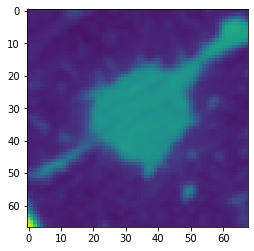

HCRP_LUAD_088_IMG0119.dcm


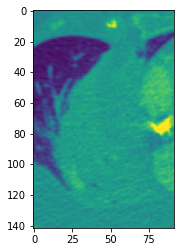

HCRP_LUAD_033_IMG0186.dcm


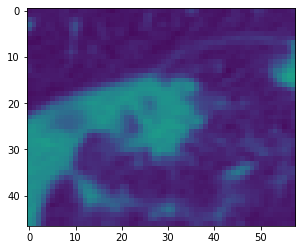

HCRP_LUAD_073_IMG0177_AUG_B.dcm


KeyboardInterrupt: 

In [271]:
gan_dir = "/Storage/PauloOctavioDir/nodule_rois/gan_aug/adeno/images/"
for f in os.listdir(gan_dir):
    print(f)
    file = gan_dir + f
    data = dcmread(file)
    image = np.array(data.pixel_array).astype("float32")
    # Conversio to HU
    intercept = int(data.RescaleIntercept)
    slope = int(data.RescaleSlope)
    image = (slope * image) + intercept
    image = normalize(image)
    plt.imshow(image, vmin=0, vmax=1)
    plt.show()